In [1]:
import pandas as pd
import pyspark 
import sklearn
import matplotlib.pyplot as plt
from pyspark.sql import SparkSession
from pandas_profiling import ProfileReport
import numpy as np
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)
%matplotlib inline

## <font color="green"> Loading Dataset

In [2]:
# create spark session
spark = SparkSession.builder.master("local").appName("assignment").getOrCreate()

/Users/6estates/opt/anaconda3/envs/starhub/lib/python3.6/site-packages/pyspark/context.py:238: FutureWarning: Python 3.6 support is deprecated in Spark 3.2.
  FutureWarning


In [3]:
# read in data files to spark dataframe
parquetFile = spark.read.parquet("../src/data/browsing_behavior")

In [4]:
# Creates or replaces a local temporary view with this DataFrame
parquetFile.createOrReplaceTempView("table")

In [5]:
file_output = spark.sql("SELECT * FROM table")
file_output.show()

+--------------+----------------+-------------+----------------+------+--------+---------------+----------------+--------------+-------+
| category_name|application_name|  domain_tags|          domain|volume|duration|      server_ip|referer_category|referer_domain|user_id|
+--------------+----------------+-------------+----------------+------+--------+---------------+----------------+--------------+-------+
|Communications|        WhatsApp|    Messaging|    whatsapp.net| 35471|     420| 203.116.210.33|              -1|          null|     12|
|Communications|              QQ|   Technology|      wxs.qq.com|339459|     252| 150.109.90.117|               0|          null|     12|
|Communications|          WeChat|    Messaging|   weixin.qq.com|  1389|      40|203.205.251.175|               0|          null|     12|
|Communications|          WeChat|    Messaging|   weixin.qq.com|  1283|      54|124.156.190.219|               0|          null|     12|
|  SearchEngine|            Bing| SearchE

In [6]:
file_output.count()

324238

## <font color="green"> EDA

In [7]:
pandas_df = file_output.toPandas()

In [8]:
profile = ProfileReport(pandas_df, title="Pandas Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 324238 entries, 0 to 324237
Data columns (total 10 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   category_name     324238 non-null  object
 1   application_name  324238 non-null  object
 2   domain_tags       320959 non-null  object
 3   domain            324238 non-null  object
 4   volume            324238 non-null  int64 
 5   duration          324238 non-null  int64 
 6   server_ip         324238 non-null  object
 7   referer_category  324238 non-null  int64 
 8   referer_domain    3859 non-null    object
 9   user_id           324238 non-null  int32 
dtypes: int32(1), int64(3), object(6)
memory usage: 23.5+ MB


In [10]:
pandas_df.category_name.value_counts()

SocialNet           63489
Ads                 53196
GoogleServices      46452
Communications      41357
Tracker             16755
DeviceServices       9760
eCommerce            7522
Weather              7138
Technology           6232
LocationServices     6099
Banking              5928
Finance              5654
News                 4790
Mail                 4653
Lifestyle            4258
Video                3905
Transportation       3403
Gov                  3403
Enterprise           2929
Web                  2755
CDN                  2517
Security             2374
Productivity         2347
ApplicationStore     1828
CloudStorage         1514
WebApps              1503
SearchEngine         1480
Media                1440
RealEstate           1350
Attack               1098
Images               1060
Travel                926
CloudServices         756
Education             641
YahooServices         616
FoodDrinks            586
Telco                 523
Games                 480
Backup      

#### <font color="black"> - a quite useful feature, as it shows some info about what the user is browsing through <br> - this feature can be binned into more general catergories based on our studying objective


In [11]:
pandas_df.application_name.value_counts()

Facebook            46753
GoogleServices      46398
WeChat              23801
AdvertisingSites    14404
TrackerSites        12510
                    ...  
ESPN                    1
Netlify                 1
Intel                   1
QQVideo                 1
OpenRice                1
Name: application_name, Length: 672, dtype: int64

In [12]:
pandas_df.application_name.nunique()

672

In [13]:
temp = pandas_df.groupby("application_name")["domain_tags"].nunique() 
temp[temp > 1]

application_name
33Across      2
99.co         2
ABCNews       2
AIA           3
AMPProject    2
             ..
YouTube       7
Zalora        2
ZhiHu         2
iTunes        2
popIn         2
Name: domain_tags, Length: 111, dtype: int64

In [14]:
# e.g. YouTube has several tags
pandas_df[pandas_df.application_name == "WeChat"].domain_tags.unique()

array(['Messaging', 'Media', 'Tracker', 'SearchEngine', None,
       'Advertising', 'ImageHosting', 'SocialNet', 'Technology',
       'Finance'], dtype=object)

In [15]:
pandas_df.application_name.nunique()

672

In [16]:
pandas_df.domain_tags.nunique()

86

In [17]:
pandas_df.category_name.nunique()

51

In [18]:
pandas_df.domain.nunique()

2519

In [19]:
pandas_df.referer_category.nunique()

19

In [20]:
pandas_df.referer_domain.nunique()

47

#### <font color="black"> - one app can have mutiple domain tags, domain_tags is a more granular feature which includes what kind of service the user was looking for

In [21]:
sum(pandas_df.groupby("application_name")["category_name"].nunique()) == 672

True

#### <font color="black"> - one app can only belong to 1 category

In [22]:
temp = pandas_df.groupby("application_name")["domain"].nunique() 
temp[temp > 1]

application_name
33Across           2
99.co              2
ABCNews            2
AIA                3
AMPProject         3
                  ..
Zaobao             2
ZhiHu              2
eCommerceSites    12
iTunes             4
popIn              2
Name: domain, Length: 221, dtype: int64

In [23]:
pandas_df[pandas_df.application_name == "Zaobao"].domain.unique()

array(['zaobao.com.sg', 'zaobao.com'], dtype=object)

In [24]:
# seems domains is something like a url, user access different domain to get different kind of services
pandas_df[pandas_df.application_name == "AIA"].domain.unique()

array(['aia.com', 'aia.com.sg', 'demdex.net'], dtype=object)

#### <font color="black"> - one app can have mutiple domains

In [25]:
pandas_df.volume.describe()

count    3.242380e+05
mean     1.299162e+04
std      4.839353e+04
min      9.600000e+01
25%      5.374000e+03
50%      8.750000e+03
75%      1.501675e+04
max      1.483833e+07
Name: volume, dtype: float64

#### <font color="orange"> - suprisingly data usage is not correlated to any of the features(except referer_domain)

In [26]:
pandas_df.duration.max()/60/60/1000

3.0737336111111113

In [27]:
pandas_df.duration.mean()/60/60/1000

0.021047474845295393

In [28]:
pandas_df.duration.median()/1000

10.554

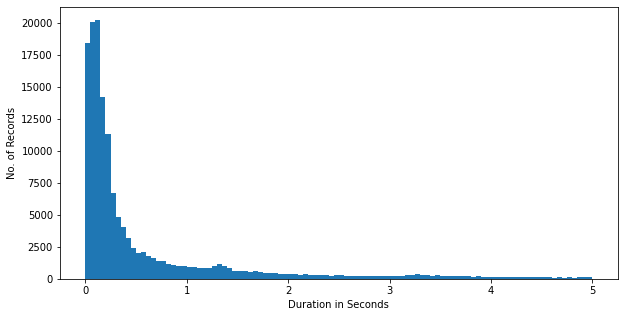

In [29]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot()
plt.hist(pandas_df.duration/1000, bins = 100, range=(0, 5))
ax.set_xlabel('Duration in Seconds')
ax.set_ylabel('No. of Records')
plt.show()

In [30]:
pandas_df[pandas_df.duration/1000 <= 3]

,category_name,application_name,domain_tags,domain,volume,duration,server_ip,referer_category,referer_domain,user_id
0,Communications,WhatsApp,Messaging,whatsapp.net,35471,420,203.116.210.33,-1,None,12
1,Communications,QQ,Technology,wxs.qq.com,339459,252,150.109.90.117,0,None,12
2,Communications,WeChat,Messaging,weixin.qq.com,1389,40,203.205.251.175,0,None,12
3,Communications,WeChat,Messaging,weixin.qq.com,1283,54,124.156.190.219,0,None,12
5,Communications,WeChat,Messaging,weixin.qq.com,1358,46,203.205.251.175,0,None,12
...,...,...,...,...,...,...,...,...,...,...
324227,Tracker,TrackerSites,Tracker,cedexis-radar.net,13010,567,103.84.152.177,-1,None,23
324228,Finance,GooglePay,Finance,androidpay-users-pa.googleapis.com,11760,570,172.217.194.92,-1,None,23
324229,LocationServices,GoogleMaps,LocationServices,maps.googleapis.com,10473,789,172.217.194.95,-1,None,23
324230,GoogleServices,GoogleServices,SearchEngine,www.google.com,9369,727,172.217.194.147,-1,None,23


#### <font color="orange"> - by looking at the maximum duration, I assume that the unit of duration is milisec

In [31]:
temp = pandas_df.groupby("referer_domain")["referer_category"].nunique() 
temp[temp > 1]

referer_domain
dinggling.com    2
Name: referer_category, dtype: int64

#### <font color="red"> - referer_domain can have 2 referer_category, but is very rare. <br> - referer is the webpage that redirect the user to the current app's address <br> - if duration < 3 sec, the user probabaly 

In [32]:
pandas_df.groupby("user_id").size()

user_id
1      8407
2     11491
3     13342
4      8564
5      8442
6     11265
7      9663
8     12683
9     12149
10    11903
11    13937
12    17552
13    16120
14    17381
15     5421
16    12355
17    15282
18     8801
19    11847
20    10200
21    10873
22     6936
23     4526
24     6896
25     7715
26     8582
27    11397
28     9350
29     7895
30     5623
31     7640
dtype: int64

#### <font color="orange"> - different user have different number of browsing records

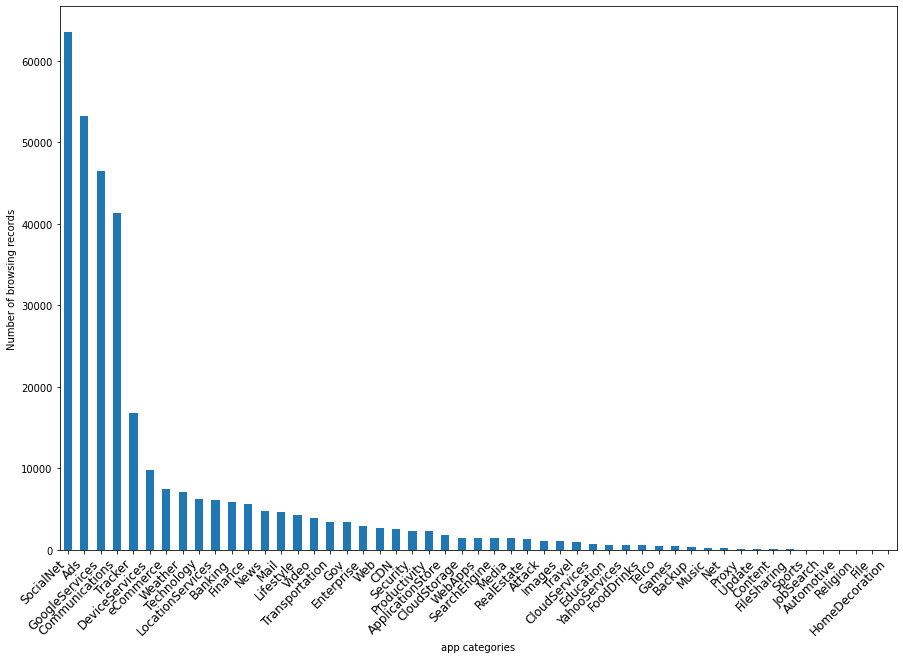

In [33]:
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)
pandas_df.groupby("category_name").size().sort_values(ascending=False).plot.bar()
plt.xticks(rotation=45, fontsize=12, ha='right')
plt.xlabel("app categories")
plt.ylabel("Number of browsing records")
plt.show()

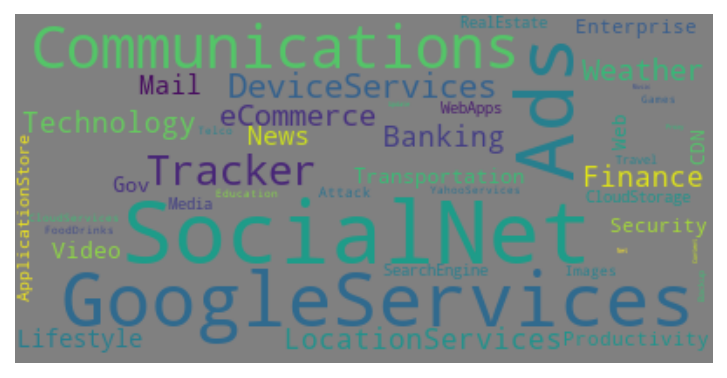

In [34]:
# lower max_font_size, change the maximum number of word and lighten the background:
text = pandas_df.groupby("category_name").size().sort_values(ascending=False).to_dict()
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="grey")
wordcloud.generate_from_frequencies(frequencies=text)
plt.rcParams['figure.dpi']= 150
plt.figure()
plt.rcParams["figure.figsize"] = (10,5)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

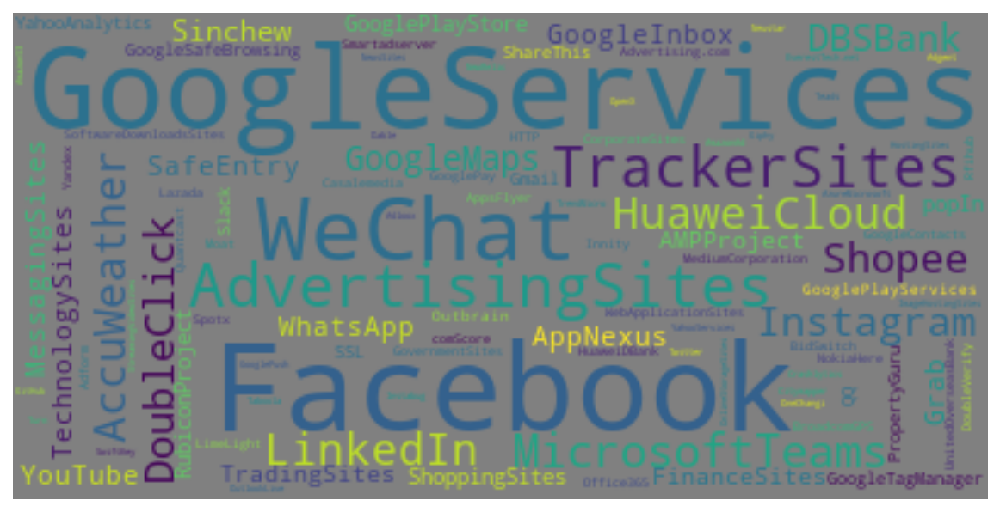

In [35]:
# lower max_font_size, change the maximum number of word and lighten the background:
text = pandas_df.groupby("application_name").size().sort_values(ascending=False).to_dict()
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="grey")
wordcloud.generate_from_frequencies(frequencies=text)
plt.rcParams['figure.dpi']= 150
plt.figure()
plt.rcParams["figure.figsize"] = (10,5)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

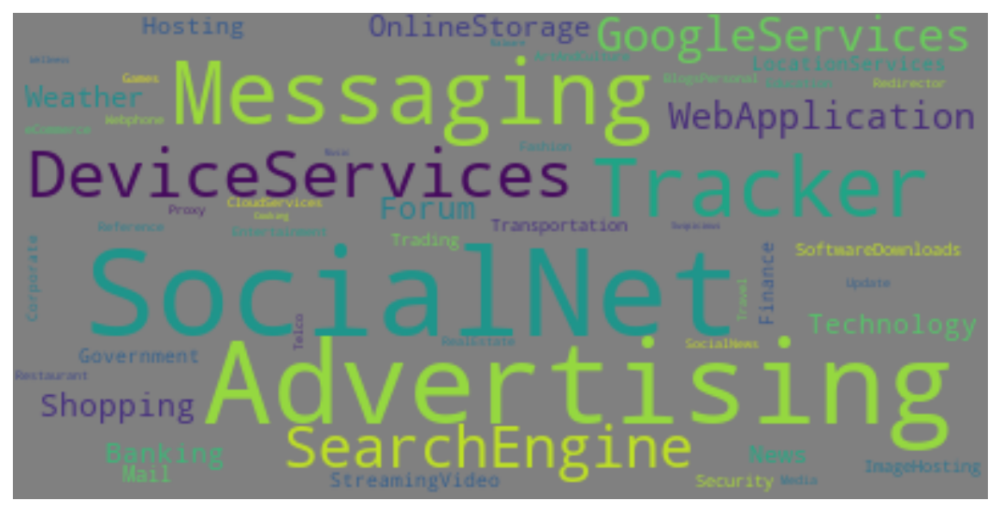

In [36]:
# lower max_font_size, change the maximum number of word and lighten the background:
text = pandas_df.groupby("domain_tags").size().sort_values(ascending=False).to_dict()
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="grey")
wordcloud.generate_from_frequencies(frequencies=text)
plt.rcParams['figure.dpi']= 150
plt.figure()
plt.rcParams["figure.figsize"] = (10,5)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

#### <font color="black"> - based on the keywords, we could think of some interesting topics to study, e.g. Travel, Game, Realestate, ecommerce, Technology, lifestyle, fooddrinks, music, sports, jobsearch, homedecoration etc.
   

#### <font color="red"> Conclusion from EDA: <br> - 1. based on browsing duration, we can filter some noises(where duration < 1 seconds) with assumption that the redirection action could be automatic e.g. ads web page auto pop up. <br> - 2. with the categorical features, we could study the ppl's interest <br> - 3. categorical features have high cardinality, we may need to perform some feature engineering <br> - 4. each row represents 1 session instead of people's attributes, so we need to aggregate these info into one row for each person  
   

## <font color="green"> Data Cleaning

In [37]:
# impute missing value
pandas_df.loc[pandas_df.referer_category == 0, "referer_domain"] = "NA"
pandas_df.loc[(pandas_df.referer_category == -1) & (pandas_df.referer_domain.isnull()), "referer_domain"] = "Unknown"

# regroup based on our studying objective
pandas_df.referer_domain.replace({
    "weixin.qq.com": "Communications",
    
    "facebook.com": "SocialNet",
    "instagram.com": "SocialNet",
    "bp.blogspot.com": "SocialNet",
    
    "mudah.com": "Cars",
    
    "dable.io": "Advertising",
    "googlesyndication.com": "Advertising",
    
    "gerenjianli.com": "Jobsearch",
    "linkedin.android": "Jobsearch",
    
    "cloudfront.net": "Technology",
    "www.googleapis.com": "Technology",
    "squarespace.com": "Technology",
    "d2l.ai": "Technology",
    "ijewelca.com": "Technology",
    "android.gm": "Technology",
    "bootstrapcdn.com": "Technology",
    
    "okeyread.com": "News",
    "chinapress.com.my": "News",
    "dinggling.com": "News",
    "17moveon.com": "News",
    "happyday543.com": "News",
    "sinchew.com.my": "News",
    "sunflyday.com": "News",
    "gogodayday.com": "News",
    "2020funtv.com": "News",
    "seehua.com": "News",
    "lookingforward.info": "News",
    "51striving.com": "News",
    "thevalue101.com": "News",
    "muscle865.com": "News",
    "itislooker.com": "News",
    
    "winning11cn.com": "Sports",
    
    "health580.net": "Health",
    
    "universaltravel.com.sg": "Travel",
    "wwprojects.com": "Travel",
    "yitinghome.com": "Travel",
    
    "Restaurant": "Food",
    "chinhuatliveseafood.sg": "Food",
    "timhowan.com": "Food",
    "anniesparadise.blogspot.com": "Food",
    "ginkhao.com.sg": "Food",
    
    "innity.net": "Advertising",
    
    "www.google.com": "Appservice",
    
    "aftershockpcsupport.com": "Computer",
    
    "stanford.edu": "Education",
    "msu.edu": "Education",
    "uni-freiburg.de": "Education",
    
    "yenlin.com": "Gambling"
    
}, inplace=True)


In [38]:
# impute missing values
pandas_df.loc[(pandas_df.application_name == "SafeEntry") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Tracker"
pandas_df.loc[(pandas_df.domain == "notes-pa.googleapis.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Appservice"
pandas_df.loc[(pandas_df.domain == "calendarpushsubscription-pa.googleapis.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Appservice"
pandas_df.loc[(pandas_df.domain == "peoplestack-pa.googleapis.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Appservice"
pandas_df.loc[(pandas_df.domain == "fatbellysg.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Restaurant"
pandas_df.loc[(pandas_df.domain == "consumabletv.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Entertainment"
pandas_df.loc[(pandas_df.domain == "qqxzb-img.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "ImageHosting"
pandas_df.loc[(pandas_df.domain == "qqxzb-img.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "ImageHosting"
pandas_df.loc[(pandas_df.domain == "muscle865.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "News"
pandas_df.loc[(pandas_df.domain == "ijewelca.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "unclekentang.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "News"
pandas_df.loc[(pandas_df.domain == "itpexception.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "licdn.cn") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "tracxn.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "51striving.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "News"
pandas_df.loc[(pandas_df.domain == "dinggling.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "News"
pandas_df.loc[(pandas_df.domain == "d2l.ai") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "towardsdatascience.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "medium.systems") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "2020funtv.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Entertainment"
pandas_df.loc[(pandas_df.domain == "discover-pa.googleapis.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Appservice"
pandas_df.loc[(pandas_df.domain == "kuasa.cloud") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "goleaf.my") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "FoodDrinks"
pandas_df.loc[(pandas_df.domain == "mobilemaps.googleapis.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "LocationServices"
pandas_df.loc[(pandas_df.domain == "adobemsbasic.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Appservice"
pandas_df.loc[(pandas_df.domain == "aftershockpcsupport.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Computer"
pandas_df.loc[(pandas_df.domain == "sfbassets.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "freshxcdn.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "loveandlemons.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Cooking"
pandas_df.loc[(pandas_df.domain == "chanelwebservices.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Luxury"
pandas_df.loc[(pandas_df.domain == "chulian.cn") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "amazon.science") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "facaishur.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Gardening"
pandas_df.loc[(pandas_df.domain == "gb-app.net") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "scone-pa.googleapis.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Appservice"
pandas_df.loc[(pandas_df.domain == "mobilemaps-pa-gz.googleapis.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Appservice"
pandas_df.loc[(pandas_df.domain == "mediaprada-meride-tv.akamaized.net") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "imakan.app") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Corporate"
pandas_df.loc[(pandas_df.domain == "saltandlavender.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Cooking"
pandas_df.loc[(pandas_df.domain == "alphaxcdn.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "clarity.ms") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "cheaper.my") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "eCommerce"
pandas_df.loc[(pandas_df.domain == "dddmobileapp.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "c3.ai") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "lltrck.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "menumodo.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Corporate"
pandas_df.loc[(pandas_df.domain == "uobclient.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Banking"
pandas_df.loc[(pandas_df.domain == "nitrocdn.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "100.com.tw") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Homestyle"
pandas_df.loc[(pandas_df.domain == "neris-assets.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "xnextcon.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "bmcx.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "SearchEngine"
pandas_df.loc[(pandas_df.domain == "disruptivetechasean.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "netflixtechblog.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "umbaga.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Unknown"
pandas_df.loc[(pandas_df.domain == "trendqube.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Telco"
pandas_df.loc[(pandas_df.domain == "dialup.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Webphone"
pandas_df.loc[(pandas_df.domain == "omise.co") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Finance"
pandas_df.loc[(pandas_df.domain == "payalebarquarter.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Shopping"
pandas_df.loc[(pandas_df.domain == "deepmind.com") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Technology"
pandas_df.loc[(pandas_df.domain == "slgnt.eu") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Education"
pandas_df.loc[(pandas_df.domain == "takayama.com.sg") & (pandas_df.domain_tags.isnull()), "domain_tags"] = "Restaurant"


pandas_df.loc[pandas_df.domain_tags.isnull(), "domain_tags"] = pandas_df.loc[pandas_df.domain_tags.isnull(), "category_name"]

pandas_df.domain_tags.replace({
    "SocialNews": "News",
    
    "WebApplication": "Appservice",
    "Proxy": "Appservice",
    "ProxyAvoidance": "Appservice",
    "DeviceServices": "Appservice",
    "SoftwareDownloads": "Appservice",
    "Redirector": "Appservice",
    "GoogleServices": "Appservice",
    "YahooServices": "Appservice",
    
    "Net": "Corporate",
    
    "CloudServices": "Technology",
    "Hosting": "Technology",
    "TechnologyNews": "Technology",
    
    "FoodDrinks": "Food",
    "Restaurant": "Food",
    "Cooking": "Food",
    
    
}, inplace=True)

In [39]:
# # lump some of the similar categories, noticed the domain_tag is highly correlated with this, 
# # so we can reduce the cardinality here and get more detailed info from domain_tag
# pandas_df.category_name = pandas_df.category_name.replace({
#     "SocialNet": "Communications",
#     "Content": "SuspiciousSites",
    
#     "News": "Media",
#     "Images": "Media",
#     "Video": "Media",
    
#     "ApplicationStore": "Appservice",
#     "SearchEngine": "Appservice",
#     "DeviceServices": "Appservice",
#     "CloudStorage": "Appservice",
#     "GoogleServices": "Appservice",
#     "Web": "Appservice",
#     "YahooServices": "Appservice",
#     "Backup": "Appservice",
#     "CloudServices": "Appservice",
#     "Update": "Appservice",
#     "File": "Appservice",
# })

In [40]:
pandas_df.rename(columns={'referer_domain': 'referer_topic',
                          'domain_tags': 'browsing_topic'}, inplace=True)

In [41]:
pandas_df = pandas_df[['user_id', 'browsing_topic', 'duration', 'referer_topic']]

In [42]:
pandas_df.head()

,user_id,browsing_topic,duration,referer_topic
0,12,Messaging,420,Unknown
1,12,Technology,252,NA
2,12,Messaging,40,NA
3,12,Messaging,54,NA
4,12,SearchEngine,65945,Unknown


In [43]:
pandas_df.browsing_topic.unique()

array(['Messaging', 'Technology', 'SearchEngine', 'ArtAndCulture',
       'SocialNet', 'OnlineStorage', 'Weather', 'Appservice', 'Mail',
       'Media', 'Advertising', 'Tracker', 'Trading', 'Web', 'Banking',
       'Finance', 'Corporate', 'News', 'Government', 'Unknown',
       'BlogsPersonal', 'Reference', 'Suspicious', 'Security', 'Update',
       'Malware', 'Forum', 'Shopping', 'ImageHosting', 'Travel',
       'StreamingVideo', 'Computer', 'Education', 'LocationServices',
       'Food', 'Games', 'Entertainment', 'Car', 'Webphone', 'eCommerce',
       'Telco', 'Wellness', 'Gardening', 'Music', 'FileSharing',
       'Transportation', 'Collaboration', 'Fashion', 'CDN', 'Health',
       'Auction', 'Sports', 'Model', 'RadioTV', 'Dynamic', 'Translation',
       'Communications', 'ApplicationStore', 'RealEstate', 'Photography',
       'Parked', 'JobSearch', 'AlcoholTobacco', 'Spam', 'Philanthropic',
       'Homestyle', 'Surveillance', 'Manga', 'HomeServices', 'Phishing',
       'Gambling',

In [44]:
pandas_df.referer_topic.unique()

array(['Unknown', 'NA', 'Communications', 'Computer', 'Appservice',
       'Education', 'SocialNet', 'News', 'Travel', 'Advertising',
       'Technology', 'Sports', 'Cars', 'Jobsearch', 'Food', 'Health',
       'Gambling'], dtype=object)

## <font color="green"> User Profiling with Word Cloud

In [45]:
df_userprof = pandas_df[["user_id", "browsing_topic", "referer_topic"]]
df_userprof

,user_id,browsing_topic,referer_topic
0,12,Messaging,Unknown
1,12,Technology,NA
2,12,Messaging,NA
3,12,Messaging,NA
4,12,SearchEngine,Unknown
...,...,...,...
324233,23,LocationServices,Unknown
324234,23,Appservice,Unknown
324235,23,SearchEngine,Unknown
324236,23,SocialNet,Unknown


'user profiling for 1'

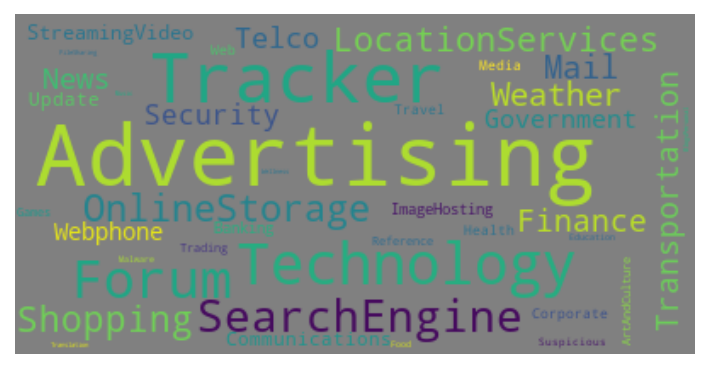

'user profiling for 2'

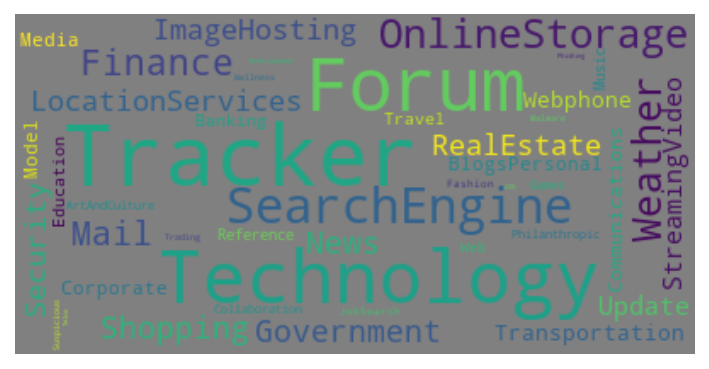

'user profiling for 3'

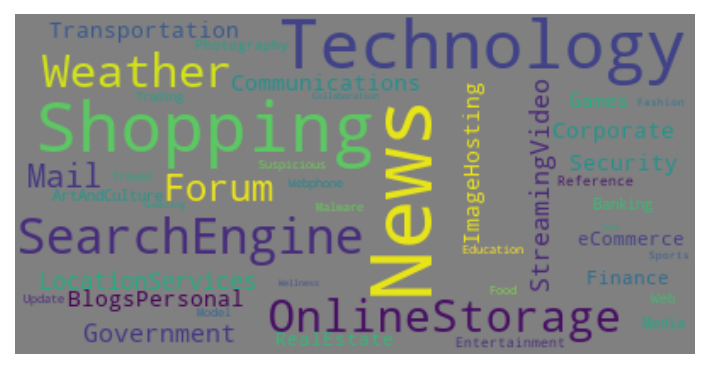

'user profiling for 4'

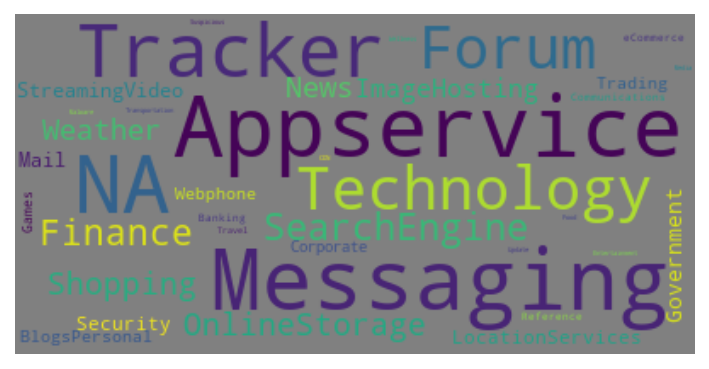

'user profiling for 5'

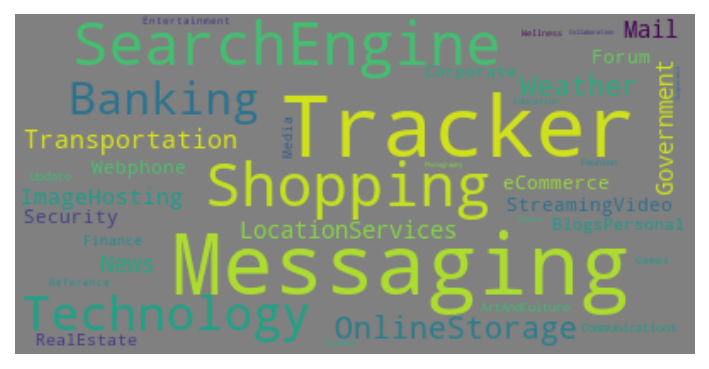

'user profiling for 6'

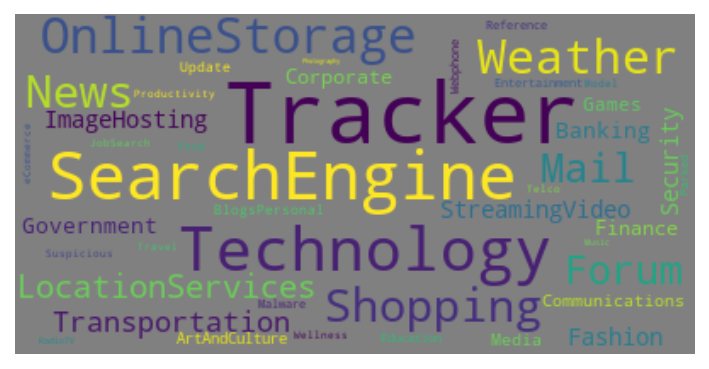

'user profiling for 7'

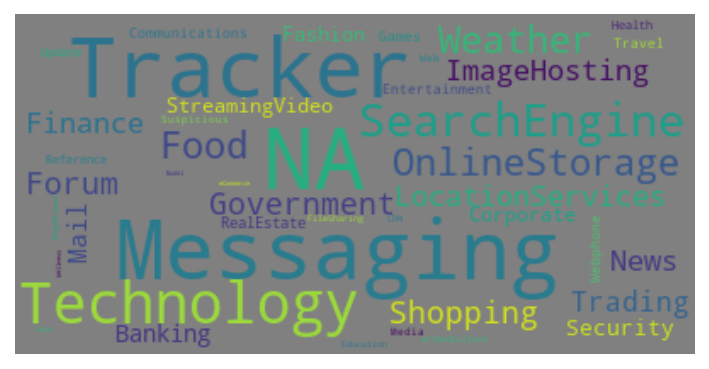

'user profiling for 8'

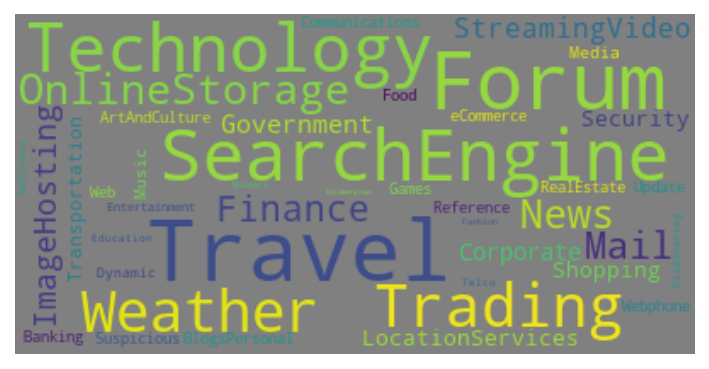

'user profiling for 9'

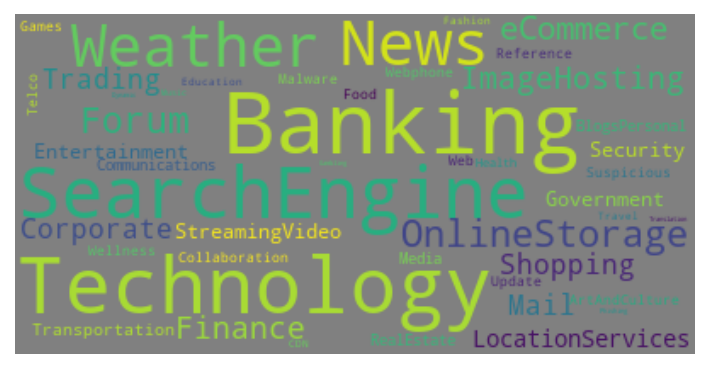

'user profiling for 10'

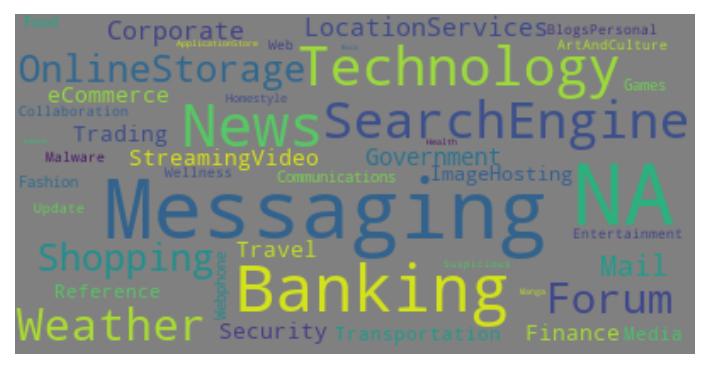

'user profiling for 11'

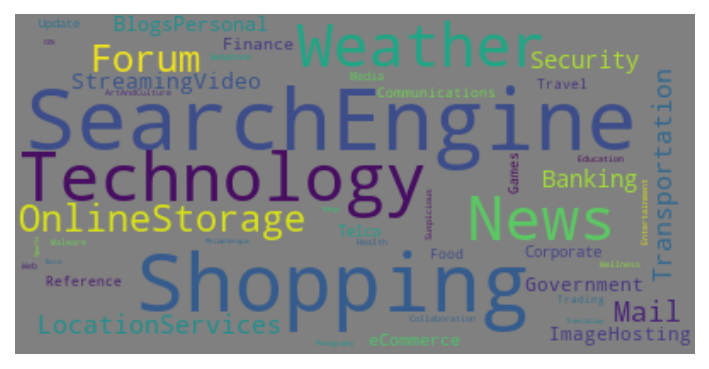

'user profiling for 12'

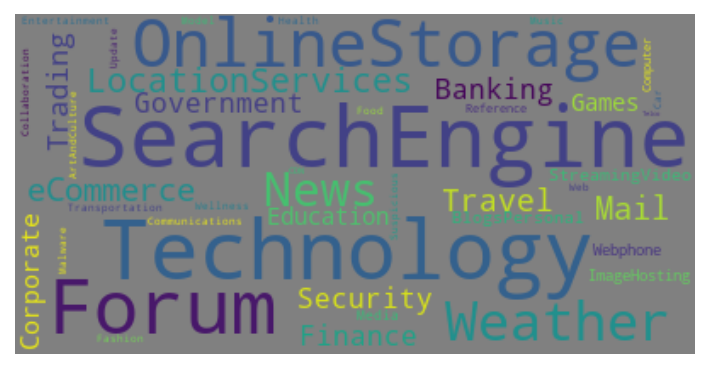

'user profiling for 13'

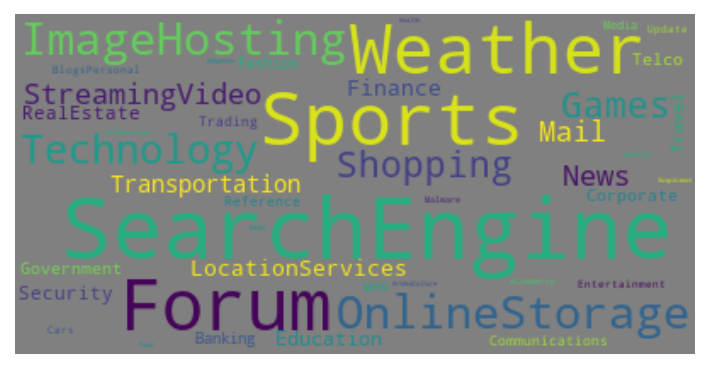

'user profiling for 14'

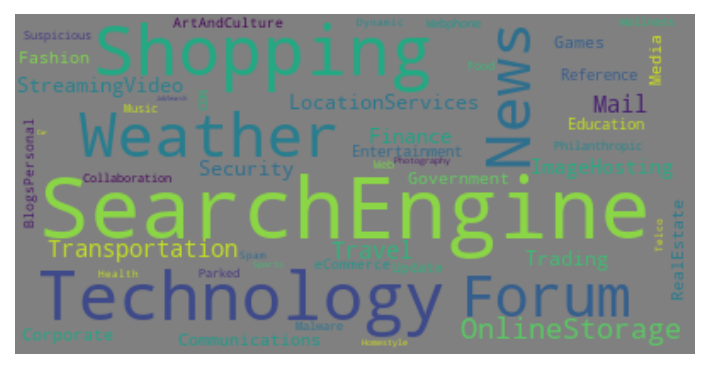

'user profiling for 15'

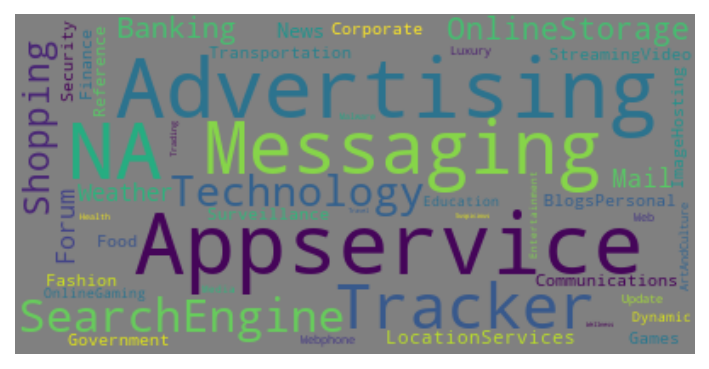

'user profiling for 16'

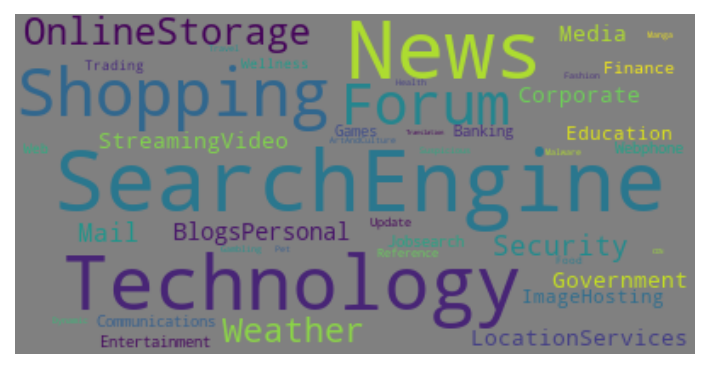

'user profiling for 17'

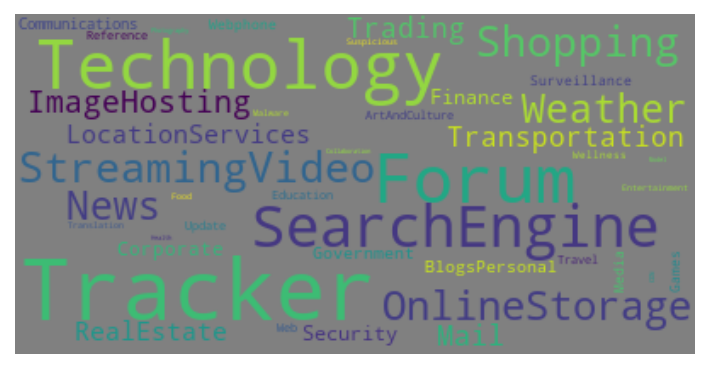

'user profiling for 18'

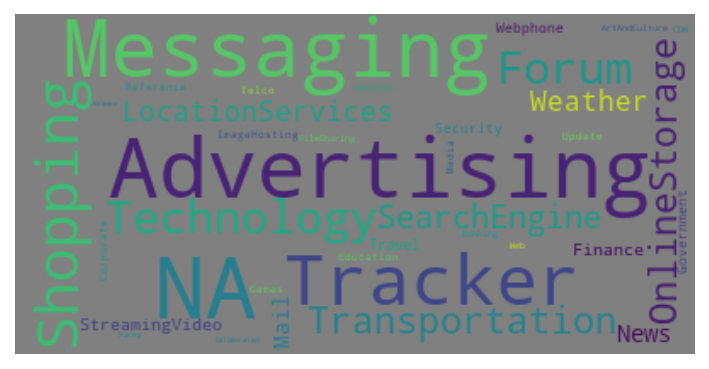

'user profiling for 19'

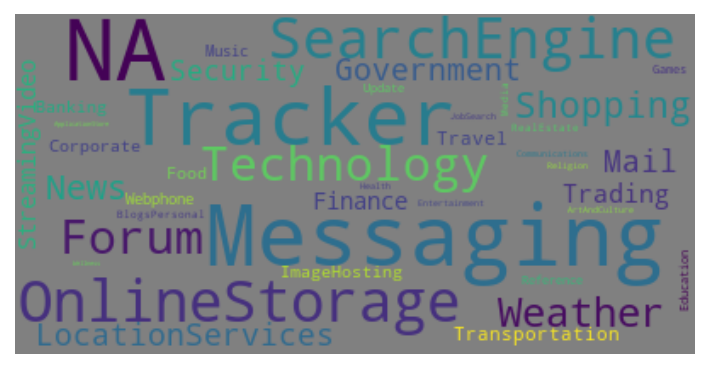

'user profiling for 20'

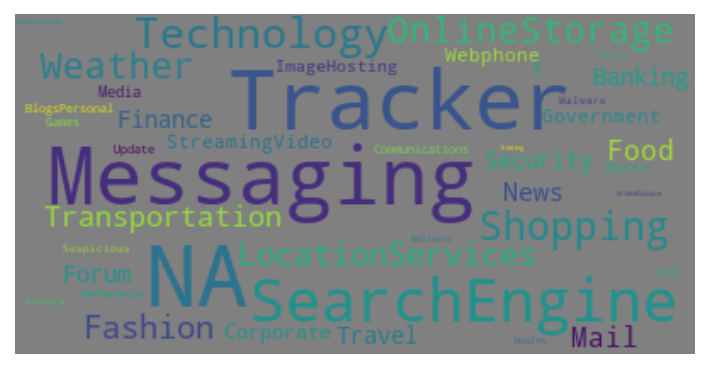

'user profiling for 21'

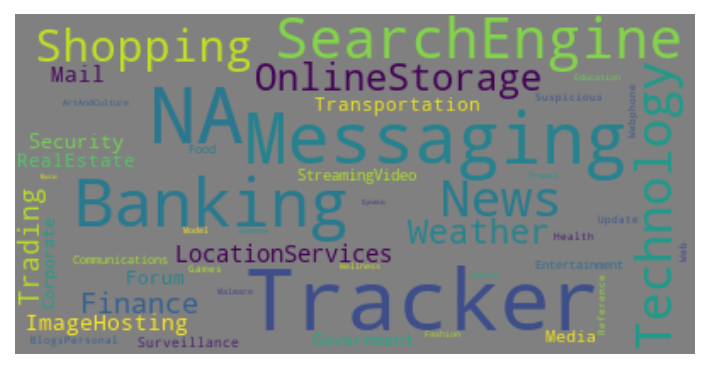

'user profiling for 22'

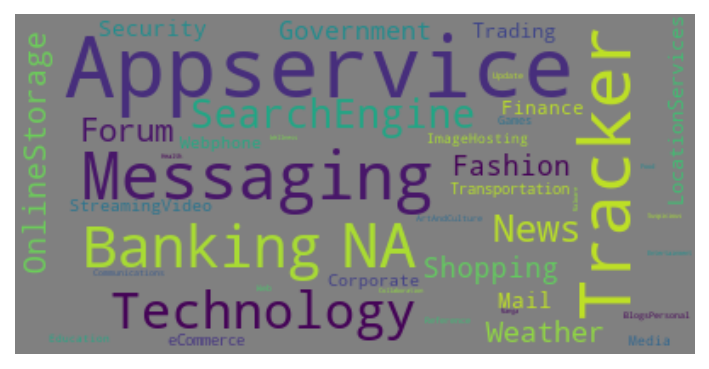

'user profiling for 23'

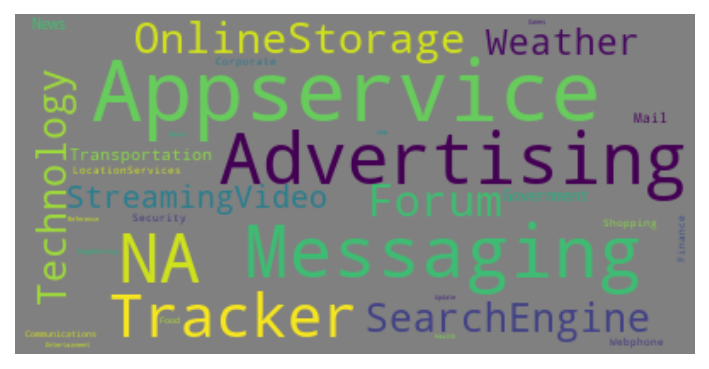

'user profiling for 24'

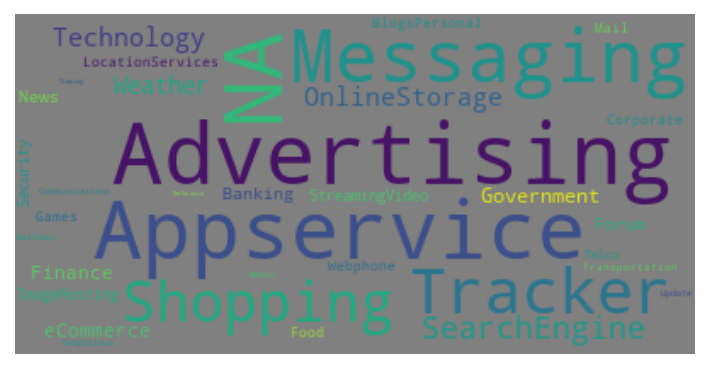

'user profiling for 25'

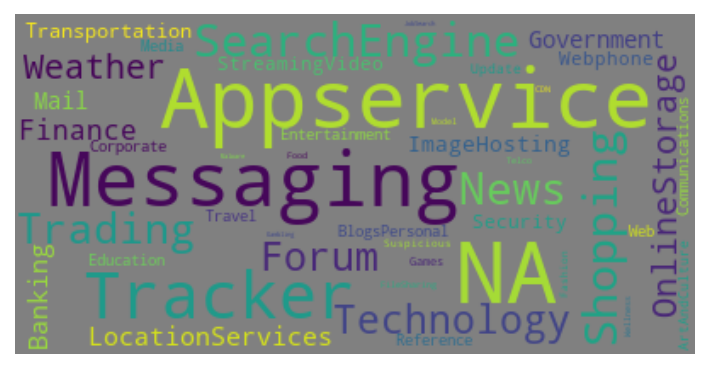

'user profiling for 26'

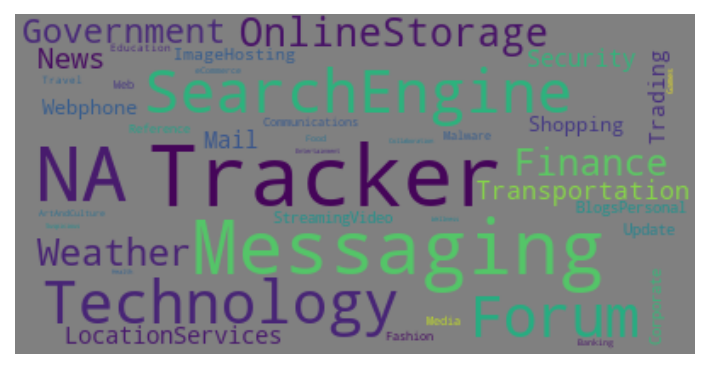

'user profiling for 27'

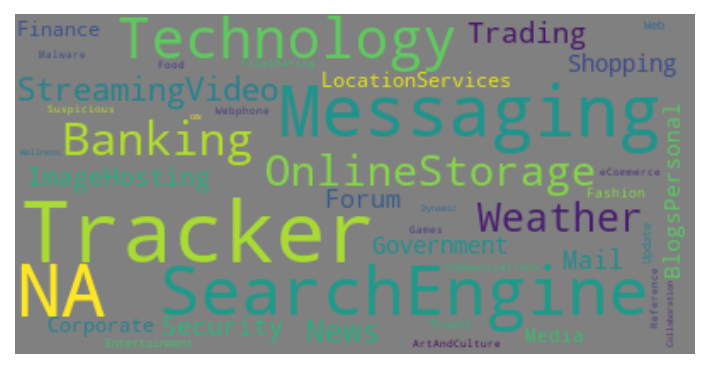

'user profiling for 28'

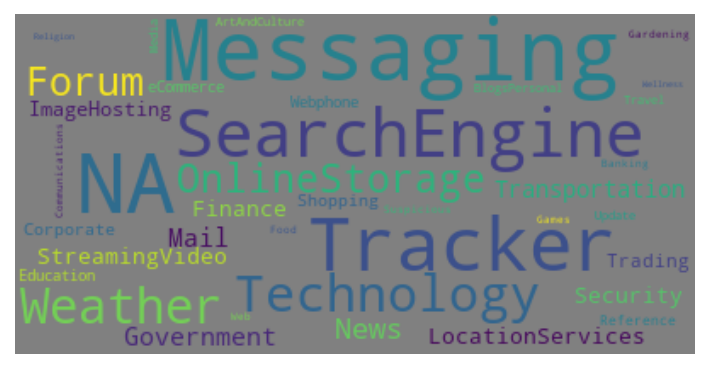

'user profiling for 29'

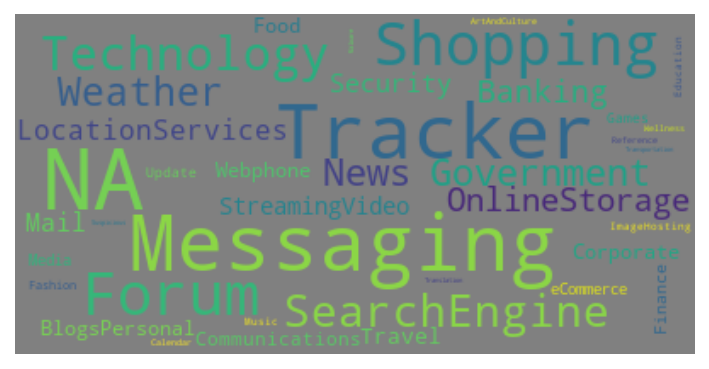

'user profiling for 30'

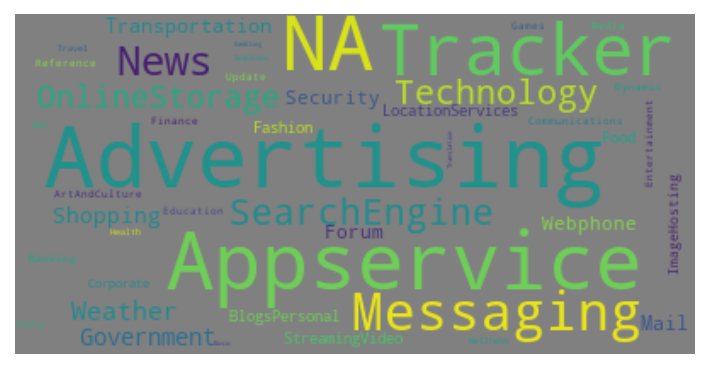

'user profiling for 31'

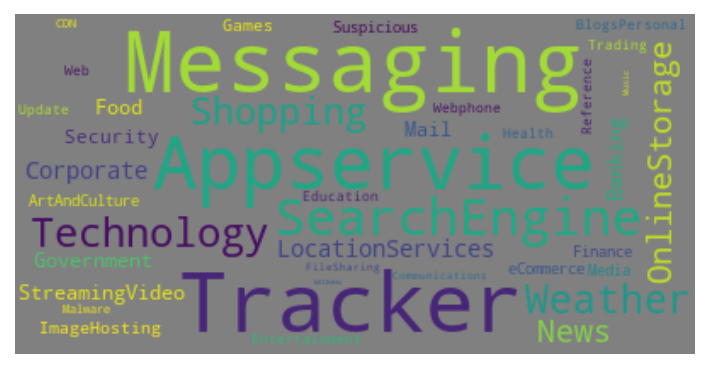

In [46]:
for user in sorted(pandas_df.user_id.unique()):
    display(f"user profiling for {user}")
    temp = pandas_df.loc[pandas_df.user_id == user, ["browsing_topic", "referer_topic"]]
    dic = pd.concat([temp.browsing_topic, temp.referer_topic], axis=0).value_counts().to_dict()
    text = {k: count for k, count in dic.items() if count < 1000}
#     del text["Unknown"]
#     del text["NA"]
    wordcloud.generate_from_frequencies(frequencies=text)
    plt.rcParams["figure.figsize"] = (10,3)
    plt.rcParams['figure.dpi']= 150
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

#### <font color="red"> Findings from profiling: <br> - Based on the user profiles, we can guess what is the hobby of each user, their age group and their current occupation. e.g. for user 31, he/she browsed "corporate", "Reference", "Finance", "Trading" etc, he/she probably is an adult, who is working or interested in Finance-related domain. 

## <font color="green"> Data Wrangling

In [47]:
# # Noticed that the NO. of users is relatively small in size, if we one-hot encode the categorical variables, the table will become
# # extremely wide, thus I attemp to reduce the No. of features by grouping some of the categories according to our studying objective
# pandas_df.domain_tags.replace({
#     "SocialNews": "News",
    
#     "WebApplication": "Appservice",
#     "Proxy": "Appservice",
#     "ProxyAvoidance": "Appservice",
#     "DeviceServices": "Appservice",
#     "SoftwareDownloads": "Appservice",
#     "Redirector": "Appservice",
#     "GoogleServices": "Appservice",
#     "YahooServices": "Appservice",
    
#     "Net": "Corporate",
    
#     "CloudServices": "Technology",
#     "Hosting": "Technology",
#     "TechnologyNews": "Technology",
    
#     "FoodDrinks": "Food",
#     "Restaurant": "Food",
#     "Cooking": "Food",
    
    
# }, inplace=True)

In [48]:
df = pd.get_dummies(pandas_df,prefix=['Browsing'], columns = ['browsing_topic'], drop_first=True)
df.head()

,user_id,duration,referer_topic,Browsing_AlcoholTobacco,Browsing_ApplicationStore,Browsing_Appservice,Browsing_ArtAndCulture,Browsing_Auction,Browsing_Banking,Browsing_BlogsPersonal,Browsing_CDN,Browsing_Calendar,Browsing_Car,Browsing_Collaboration,Browsing_Communications,Browsing_Computer,Browsing_Corporate,Browsing_Dynamic,Browsing_Education,Browsing_Entertainment,Browsing_Fashion,Browsing_FileSharing,Browsing_Finance,Browsing_Food,Browsing_FortuneTelling,Browsing_Forum,Browsing_Gambling,Browsing_Games,Browsing_Gardening,Browsing_Government,Browsing_Health,Browsing_HomeServices,Browsing_Homestyle,Browsing_ImageHosting,Browsing_Insurance,Browsing_JobSearch,Browsing_Library,Browsing_LocationServices,Browsing_Luxury,Browsing_Mail,Browsing_Malware,Browsing_Manga,Browsing_Media,Browsing_Messaging,Browsing_Model,Browsing_MoneyLending,Browsing_Music,Browsing_News,Browsing_OnlineGaming,Browsing_OnlineStorage,Browsing_Parked,Browsing_Pet,Browsing_Philanthropic,Browsing_Phishing,Browsing_Photography,Browsing_Productivity,Browsing_RadioTV,Browsing_RealEstate,Browsing_Reference,Browsing_Religion,Browsing_SearchEngine,Browsing_Security,Browsing_Shopping,Browsing_SocialNet,Browsing_Spam,Browsing_Sports,Browsing_StreamingVideo,Browsing_Surveillance,Browsing_Suspicious,Browsing_Technology,Browsing_Telco,Browsing_Tracker,Browsing_Trading,Browsing_Translation,Browsing_Transportation,Browsing_Travel,Browsing_Unknown,Browsing_Update,Browsing_Weather,Browsing_Web,Browsing_WebApps,Browsing_Webphone,Browsing_Wellness,Browsing_eCommerce
0,12,420,Unknown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,12,252,NA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,12,40,NA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,12,54,NA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,12,65945,Unknown,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [49]:
for name in df.columns[3:]:
    df[name] = np.where(df[name] == 1, df.duration, 0)

In [50]:
df = df.drop("duration", axis=1)

In [51]:
df = pd.get_dummies(df,prefix=['Referer'], columns = ['referer_topic'], drop_first=True)

In [52]:
df = df.groupby("user_id").sum().reset_index()

In [53]:
# drop some columns as they are 
# 1. unknown - not explainable or 
# 2. not related - they are out of our studying objective
# those removed columns could be useful for other studying objectives
col_to_drop = ["Browsing_ApplicationStore", "Browsing_Calendar", "Browsing_Collaboration", "Browsing_Communications", "Browsing_Malware",
               "Browsing_Messaging", "Browsing_News", "Browsing_Spam", "Browsing_Surveillance", "Browsing_Suspicious", "Browsing_Telco",
               "Browsing_Weather", "Browsing_Appservice","Browsing_Unknown",  
               "Browsing_CDN", "Browsing_Dynamic", "Browsing_FileSharing", "Browsing_Forum", "Browsing_Government", "Browsing_ImageHosting", 
               "Browsing_LocationServices", "Browsing_Mail", "Browsing_Media", "Browsing_Model", "Browsing_OnlineStorage", "Browsing_Productivity",
               "Browsing_SearchEngine", "Browsing_Security", "Browsing_StreamingVideo", "Browsing_Tracker", "Browsing_Update", "Browsing_Web", "Browsing_WebApps",
               "Browsing_Webphone", "Referer_Appservice", "Referer_Unknown", "Referer_NA", "Referer_Communications", 
               "Referer_SocialNet",
              ]
df.drop(col_to_drop, axis=1, inplace=True)

In [54]:
df.shape

(31, 59)

## <font color="green"> Data Modelling

In [55]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [56]:
user = df.iloc[:, 0]

In [57]:
data = df.iloc[:, 1:]

In [58]:
scaler = StandardScaler(with_mean=True, with_std=True)

In [59]:
data_scaled = pd.DataFrame(scaler.fit_transform(data), columns=data.columns)

In [60]:
data_scaled

,Browsing_AlcoholTobacco,Browsing_ArtAndCulture,Browsing_Auction,Browsing_Banking,Browsing_BlogsPersonal,Browsing_Car,Browsing_Computer,Browsing_Corporate,Browsing_Education,Browsing_Entertainment,Browsing_Fashion,Browsing_Finance,Browsing_Food,Browsing_FortuneTelling,Browsing_Gambling,Browsing_Games,Browsing_Gardening,Browsing_Health,Browsing_HomeServices,Browsing_Homestyle,Browsing_Insurance,Browsing_JobSearch,Browsing_Library,Browsing_Luxury,Browsing_Manga,Browsing_MoneyLending,Browsing_Music,Browsing_OnlineGaming,Browsing_Parked,Browsing_Pet,Browsing_Philanthropic,Browsing_Phishing,Browsing_Photography,Browsing_RadioTV,Browsing_RealEstate,Browsing_Reference,Browsing_Religion,Browsing_Shopping,Browsing_SocialNet,Browsing_Sports,Browsing_Technology,Browsing_Trading,Browsing_Translation,Browsing_Transportation,Browsing_Travel,Browsing_Wellness,Browsing_eCommerce,Referer_Cars,Referer_Computer,Referer_Education,Referer_Food,Referer_Gambling,Referer_Health,Referer_Jobsearch,Referer_News,Referer_Sports,Referer_Technology,Referer_Travel
0,-0.228186,1.418342,-0.285711,-1.292140,-0.780737,-0.387040,-0.182574,-0.884969,-0.364821,-1.080058,-0.459895,0.424327,-0.926533,-0.327314,-0.494507,-0.613129,-0.205432,1.385573,-0.378112,-0.223243,-0.253758,-0.379384,-0.182574,-0.260155,-0.253389,-0.182574,-0.112940,-0.240928,-0.441513,-0.182574,-0.192586,-0.355026,-0.092424,-0.340090,-0.600451,-0.870128,-0.237352,-1.082951,-0.769022,-0.404503,0.645257,-0.096727,0.620791,0.670282,0.247675,-0.516178,-0.706111,-0.182574,-0.182574,-0.364925,-0.319857,-0.182574,-0.182574,-0.203745,-0.649015,-0.182574,-0.195898,-0.215153
1,-0.228186,-0.609714,-0.285711,-0.359416,1.113664,-0.387040,-0.182574,-0.699016,0.400763,-0.942864,-0.170530,0.053383,-0.960959,-0.327314,-0.494507,-0.931847,-0.205432,-0.128757,-0.301843,-0.223243,-0.253758,0.545413,-0.182574,-0.260155,-0.253389,-0.182574,1.285969,-0.240928,-0.441513,-0.182574,5.474281,-0.352565,0.833515,-0.340090,2.538735,-0.345237,-0.237352,-0.506481,0.327438,-0.403349,2.356295,0.364362,0.537235,-0.202888,-0.344970,-0.437499,-0.706111,-0.182574,-0.182574,-0.364925,-0.319857,-0.182574,-0.182574,-0.203745,-0.649015,-0.182574,-0.195898,-0.215153
2,-0.228186,1.141870,-0.285711,0.423073,0.497356,-0.387040,-0.182574,1.246841,0.002515,0.010938,-0.311133,0.238363,-0.967765,3.053921,2.280699,1.709622,-0.205432,-0.194714,4.307030,-0.223243,-0.253758,-0.379384,-0.182574,-0.260155,-0.253389,-0.182574,-0.566677,-0.240928,1.148075,-0.182574,-0.192586,0.125820,2.776034,-0.340090,0.429737,0.325175,-0.237352,1.940823,2.111629,3.549833,0.281358,0.274901,-1.088451,-0.469444,-0.501912,-0.271987,-0.034364,-0.182574,-0.182574,-0.364925,-0.319857,-0.182574,-0.182574,-0.203745,3.177192,-0.182574,-0.106592,-0.215153
3,1.313976,-0.925626,-0.285711,-0.616372,1.033549,-0.387040,-0.182574,-0.459125,-0.927084,-0.178060,-0.459895,-0.334819,-0.400489,-0.327314,-0.494507,0.380305,-0.205432,-0.468602,-0.378112,-0.223243,-0.253758,-0.379384,-0.182574,-0.260155,-0.253389,-0.182574,-0.566543,-0.240928,-0.441513,-0.182574,-0.192586,-0.355026,-0.448020,-0.340090,-0.634747,-0.311920,-0.237352,0.611753,-0.472488,-0.403253,0.197209,-0.113637,-0.572709,-0.791682,-0.321913,-0.030440,-0.021748,-0.182574,-0.182574,-0.364925,-0.319857,-0.182574,-0.182574,-0.203745,-0.649015,-0.182574,-0.195898,-0.215153
4,-0.195199,0.530229,3.859530,-0.257165,0.542693,-0.387040,-0.182574,0.112454,-0.690843,-1.072991,-0.441678,-1.399081,-0.979315,-0.327314,-0.494507,-0.512563,-0.205432,-0.470648,-0.378112,-0.223243,-0.253758,-0.379384,-0.182574,-0.260155,-0.253389,-0.182574,-0.566463,-0.240928,-0.441513,-0.182574,-0.192586,-0.355026,1.247395,-0.340090,0.977885,-0.583695,-0.237352,-0.757418,0.649001,-0.404503,-0.894991,-1.165334,-1.088451,0.192130,-0.602642,-0.284039,1.120436,-0.182574,-0.182574,-0.364925,-0.319857,-0.182574,-0.182574,-0.203745,-0.649015,-0.182574,-0.195898,-0.215153
5,-0.228186,0.992947,-0.285711,-0.842587,-0.431400,-0.387040,-0.182574,0.675749,-0.139313,-0.859

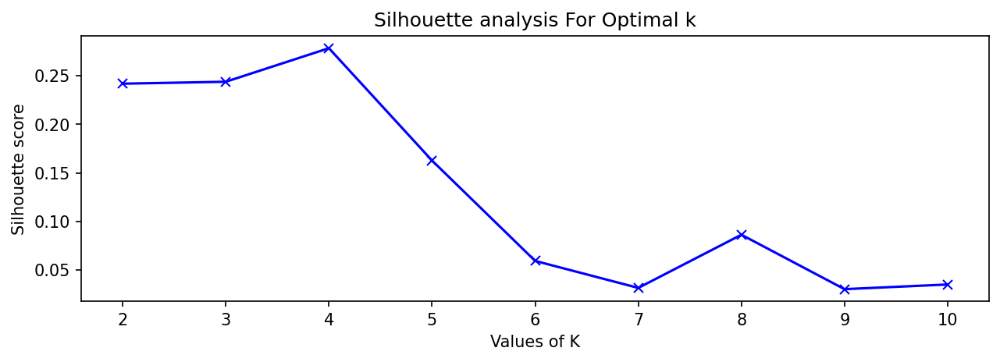

In [61]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
silhouette_avg = []
for n in range_n_clusters:
 # initialise kmeans
 kmeans = KMeans(n_clusters=n, 
                 n_init=10,
                 max_iter=1000,
                 init='k-means++',
                random_state=2)
 kmeans.fit(data_scaled)
 cluster_labels = kmeans.labels_
 # silhouette score
 silhouette_avg.append(silhouette_score(data_scaled, cluster_labels))
    
plt.plot(range_n_clusters,silhouette_avg,'bx-')    
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()

In [62]:
kmeans = KMeans(n_clusters=4, 
                n_init=10,
                max_iter=1000,
                init='k-means++',
                random_state=2)

In [63]:
kmeans.fit(data_scaled)

KMeans(max_iter=1000, n_clusters=4, random_state=2)

In [64]:
cluster = pd.DataFrame(kmeans.labels_, columns=["Cluster"])

In [65]:
pd.concat([cluster, df], axis=1)

,Cluster,user_id,Browsing_AlcoholTobacco,Browsing_ArtAndCulture,Browsing_Auction,Browsing_Banking,Browsing_BlogsPersonal,Browsing_Car,Browsing_Computer,Browsing_Corporate,Browsing_Education,Browsing_Entertainment,Browsing_Fashion,Browsing_Finance,Browsing_Food,Browsing_FortuneTelling,Browsing_Gambling,Browsing_Games,Browsing_Gardening,Browsing_Health,Browsing_HomeServices,Browsing_Homestyle,Browsing_Insurance,Browsing_JobSearch,Browsing_Library,Browsing_Luxury,Browsing_Manga,Browsing_MoneyLending,Browsing_Music,Browsing_OnlineGaming,Browsing_Parked,Browsing_Pet,Browsing_Philanthropic,Browsing_Phishing,Browsing_Photography,Browsing_RadioTV,Browsing_RealEstate,Browsing_Reference,Browsing_Religion,Browsing_Shopping,Browsing_SocialNet,Browsing_Sports,Browsing_Technology,Browsing_Trading,Browsing_Translation,Browsing_Transportation,Browsing_Travel,Browsing_Wellness,Browsing_eCommerce,Referer_Cars,Referer_Computer,Referer_Education,Referer_Food,Referer_Gambling,Referer_Health,Referer_Jobsearch,Referer_News,Referer_Sports,Referer_Technology,Referer_Travel
0,0,1,0,4567126,0,236852,783946,0,0,803626,407226,0,0,5202323,37976,0,0,907925,0,704779,0,0,0,0,0,0,0,0,241725,0,0,0,0,0,441874,0,37866,414835,0,1556723,144958769,0,28946619,816905,414894,3095182,1099930,211025,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,2,0,1143781,0,1681538,2689436,0,0,1066835,961710,73496,382385,4480620,13207,0,0,406183,0,129811,7473,0,0,127553,0,0,0,0,986983,0,0,0,5769853,268,806999,0,3503841,732671,0,4041724,204778482,120,43567942,1169388,394612,1401106,349890,294554,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,3,0,4100443,0,2893526,2069520,0,0,3821107,673274,584457,196583,4840514,8310,1116,63,4564521,0,104768,459059,0,0,0,0,0,0,0,0,0,128646,0,0,52376,1572991,0,1175297,1138623,0,14591364,302118855,411035,25836998,1100999,0,883950,151268,470268,717816,0.0,0.0,0.0,0.0,0.0,0.0,0.0,240.0,0.0,2.0,0.0
3,0,4,10332,610523,0,1283541,2608852,0,0,1406389,0,483209,0,3725340,416456,0,0,2471841,0,777,0,0,0,0,0,0,0,0,71,0,0,0,0,0,301652,0,0,752845,0,8862115,161136808,130,25117917,803978,125189,258761,379071,726704,731297,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,5,221,3067997,138931,1839913,2115123,0,0,2215433,171100,3786,24073,1654728,0,0,0,1066242,0,0,0,0,0,0,0,0,0,0,114,0,0,0,0,0,970204,0,1780507,588278,0,2960005,222322028,0,15784748,0,0,2167498,23785,457473,1951812,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0,6,0,3849063,0,933159,1135328,0,0,3012752,570553,117953,595810,7869540,10771,0,0,1465885,0,0,0,0,0,298652,0,0,0,0,319,0,84275,0,0,305247,425639,97170,9597,774395,0,9432982,234637841,0,20710048,0,397262,1753144,138963,463260,1225012,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0,7,0,3055237,0,1617208,63230,0,0,3146916,305269,1066025,1228397,2880582,2926932,0,0,1824637,0,436422,0,0,0,0,0,0,0,0,0,0,0,0,0,0,258859,0,1540658,887674,0,3072636,155735221,0,25375748,1138503,312929,0,680695,209717,255215,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0,8,0,7332307,0,449267,578011,0,0,2184601,141951,288768,97158,6716763,489851,0,0,3004924,0,0,13899,1278,0,0,0,0,0,0,461870,0,0,0,0,0,61561,0,1410461,607522,0,5064121,213642054,111,29858870,2824005,343565,1153043,294342,438192,926887,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,526.0
8,0,9,0,1218978,0,3213265,2096615,0,0,3412775,255189,323587,6158,5132108,1038866,0,43,956080,0,28773,0,0,0,0,0,0,0,0,221,0,62832,0,0,500813,221711,0,1039875,1418817,0,2516721,204117838,0,27004696,1249217,228470,641442,67622,1234665,5063855,0.0,0.0,0.0,0.0,0.0,0.0,0.0,61.0,0.0,2.0,0.0
9,0,10,0,3976760,0,3766081,532060,0,0,5245031,61899,401384,681039,5606175,1691411,0,45,1798712,0,445953,0,3846,0,0,0,0,362,0,610677,0,0,0,0,0,122914,0,14836,1816723,0,8609081,201113391,247,31615701,832113,240709,1703984,1625966,1340278,619475,0.0,0.0,0.0,0.0,0.0,0.0,0.0,128.0,0.0,0.0,0.0


#### <font color="black"> By looking at the clustering result from K-Means, it does not look convincing to me because most of the users are lumped into cluster 0, I think this is probably due to the sparsity of the data, as the one-hot encoding lead to more number of features while the No. of rows/users is 31 only. In this case, the K-Means does not perform well enough. Thus I have explored other way of clustering methods.


In [66]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

In [67]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

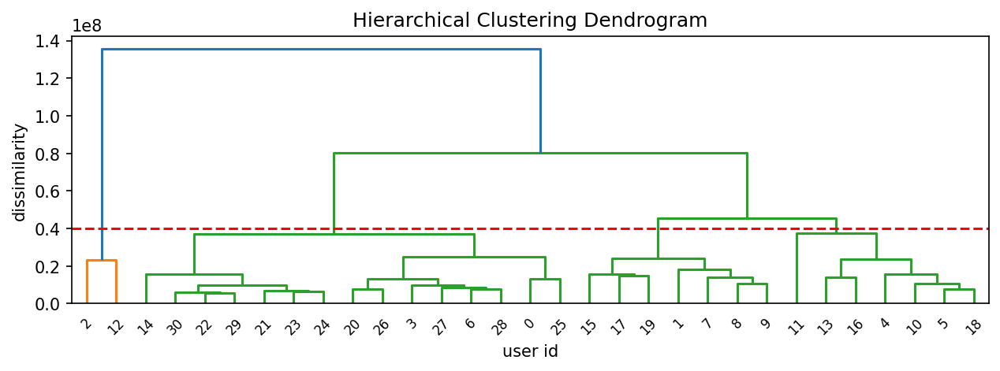

In [68]:
model = AgglomerativeClustering(distance_threshold=0, 
                                n_clusters=None,
                                affinity='euclidean', 
                                linkage='average')
model = model.fit(data)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode=None)
plt.xlabel("user id")
plt.ylabel("dissimilarity")
plt.axhline(y=0.4e8, linestyle='--', color="red") 
plt.show()

#### <font color="orange"> based on the dendrogram, if we set dissimilarity threshold at 0.4e8, then we can get 4 clusters

In [69]:
agg = AgglomerativeClustering(n_clusters=4,
                                affinity='euclidean', 
                                linkage='average')
agg = model.fit(data)

In [70]:
labels = agg.labels_
labels

array([17, 21, 19, 22, 27, 25, 26, 15, 20, 18,  9, 10, 23, 16, 12, 24,  7,
       29,  8, 28, 11, 13, 30, 14,  4,  5,  3,  6,  1,  2,  0])

In [71]:
cluster = pd.DataFrame(agg.labels_, columns=["Cluster"])

In [72]:
pd.concat([cluster, df], axis=1)

,Cluster,user_id,Browsing_AlcoholTobacco,Browsing_ArtAndCulture,Browsing_Auction,Browsing_Banking,Browsing_BlogsPersonal,Browsing_Car,Browsing_Computer,Browsing_Corporate,Browsing_Education,Browsing_Entertainment,Browsing_Fashion,Browsing_Finance,Browsing_Food,Browsing_FortuneTelling,Browsing_Gambling,Browsing_Games,Browsing_Gardening,Browsing_Health,Browsing_HomeServices,Browsing_Homestyle,Browsing_Insurance,Browsing_JobSearch,Browsing_Library,Browsing_Luxury,Browsing_Manga,Browsing_MoneyLending,Browsing_Music,Browsing_OnlineGaming,Browsing_Parked,Browsing_Pet,Browsing_Philanthropic,Browsing_Phishing,Browsing_Photography,Browsing_RadioTV,Browsing_RealEstate,Browsing_Reference,Browsing_Religion,Browsing_Shopping,Browsing_SocialNet,Browsing_Sports,Browsing_Technology,Browsing_Trading,Browsing_Translation,Browsing_Transportation,Browsing_Travel,Browsing_Wellness,Browsing_eCommerce,Referer_Cars,Referer_Computer,Referer_Education,Referer_Food,Referer_Gambling,Referer_Health,Referer_Jobsearch,Referer_News,Referer_Sports,Referer_Technology,Referer_Travel
0,17,1,0,4567126,0,236852,783946,0,0,803626,407226,0,0,5202323,37976,0,0,907925,0,704779,0,0,0,0,0,0,0,0,241725,0,0,0,0,0,441874,0,37866,414835,0,1556723,144958769,0,28946619,816905,414894,3095182,1099930,211025,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,21,2,0,1143781,0,1681538,2689436,0,0,1066835,961710,73496,382385,4480620,13207,0,0,406183,0,129811,7473,0,0,127553,0,0,0,0,986983,0,0,0,5769853,268,806999,0,3503841,732671,0,4041724,204778482,120,43567942,1169388,394612,1401106,349890,294554,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,19,3,0,4100443,0,2893526,2069520,0,0,3821107,673274,584457,196583,4840514,8310,1116,63,4564521,0,104768,459059,0,0,0,0,0,0,0,0,0,128646,0,0,52376,1572991,0,1175297,1138623,0,14591364,302118855,411035,25836998,1100999,0,883950,151268,470268,717816,0.0,0.0,0.0,0.0,0.0,0.0,0.0,240.0,0.0,2.0,0.0
3,22,4,10332,610523,0,1283541,2608852,0,0,1406389,0,483209,0,3725340,416456,0,0,2471841,0,777,0,0,0,0,0,0,0,0,71,0,0,0,0,0,301652,0,0,752845,0,8862115,161136808,130,25117917,803978,125189,258761,379071,726704,731297,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,27,5,221,3067997,138931,1839913,2115123,0,0,2215433,171100,3786,24073,1654728,0,0,0,1066242,0,0,0,0,0,0,0,0,0,0,114,0,0,0,0,0,970204,0,1780507,588278,0,2960005,222322028,0,15784748,0,0,2167498,23785,457473,1951812,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,25,6,0,3849063,0,933159,1135328,0,0,3012752,570553,117953,595810,7869540,10771,0,0,1465885,0,0,0,0,0,298652,0,0,0,0,319,0,84275,0,0,305247,425639,97170,9597,774395,0,9432982,234637841,0,20710048,0,397262,1753144,138963,463260,1225012,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,26,7,0,3055237,0,1617208,63230,0,0,3146916,305269,1066025,1228397,2880582,2926932,0,0,1824637,0,436422,0,0,0,0,0,0,0,0,0,0,0,0,0,0,258859,0,1540658,887674,0,3072636,155735221,0,25375748,1138503,312929,0,680695,209717,255215,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,15,8,0,7332307,0,449267,578011,0,0,2184601,141951,288768,97158,6716763,489851,0,0,3004924,0,0,13899,1278,0,0,0,0,0,0,461870,0,0,0,0,0,61561,0,1410461,607522,0,5064121,213642054,111,29858870,2824005,343565,1153043,294342,438192,926887,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,526.0
8,20,9,0,1218978,0,3213265,2096615,0,0,3412775,255189,323587,6158,5132108,1038866,0,43,956080,0,28773,0,0,0,0,0,0,0,0,221,0,62832,0,0,500813,221711,0,1039875,1418817,0,2516721,204117838,0,27004696,1249217,228470,641442,67622,1234665,5063855,0.0,0.0,0.0,0.0,0.0,0.0,0.0,61.0,0.0,2.0,0.0
9,18,10,0,3976760,0,3766081,532060,0,0,5245031,61899,401384,681039,5606175,1691411,0,45,1798712,0,445953,0,3846,0,0,0,0,362,0,610677,0,0,0,0,0,122914,0,14836,1816723,0,8609081,201113391,247,31615701,832113,240709,1703984,1625966,1340278,619475,0.0,0.0,0.0,0.0,0.0,0.0,0.0,128.0,0.0,0.0,0.0


'user profiling for 1'

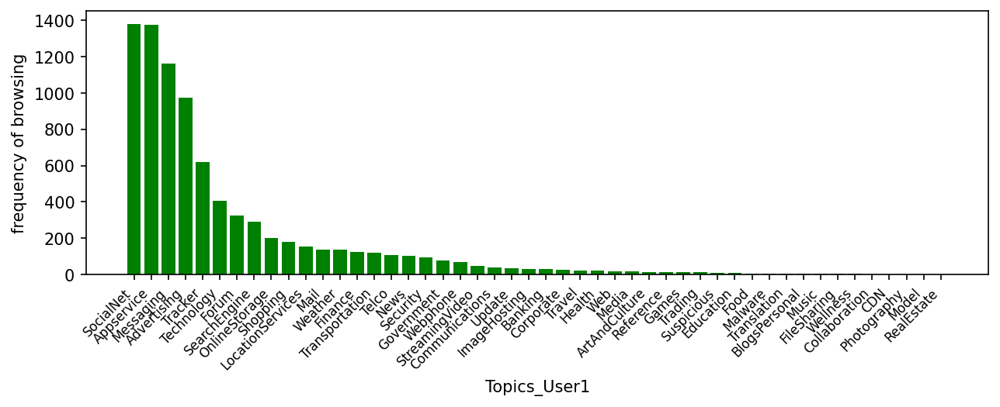

'user profiling for 2'

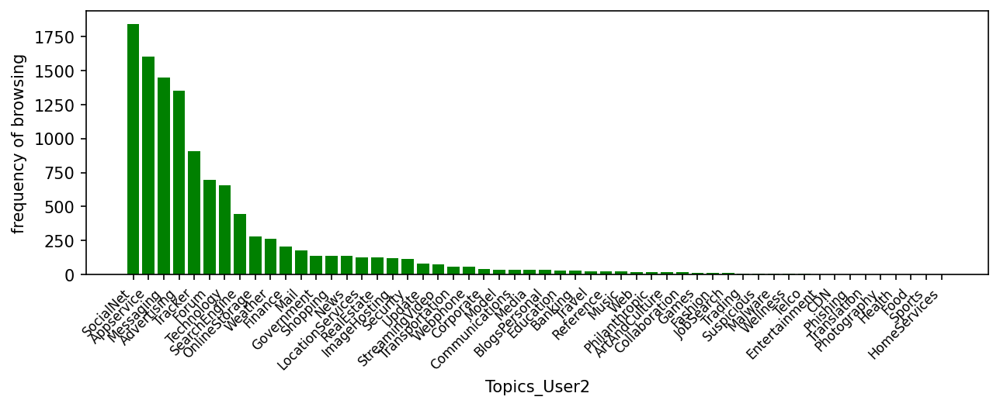

'user profiling for 3'

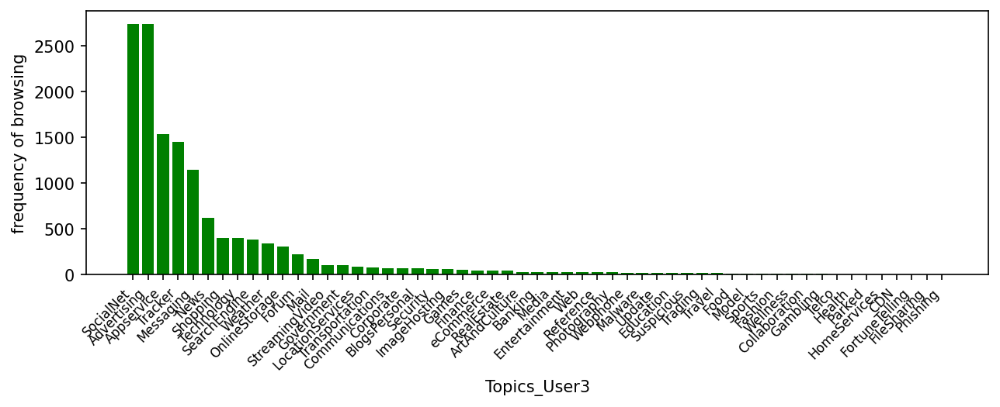

'user profiling for 4'

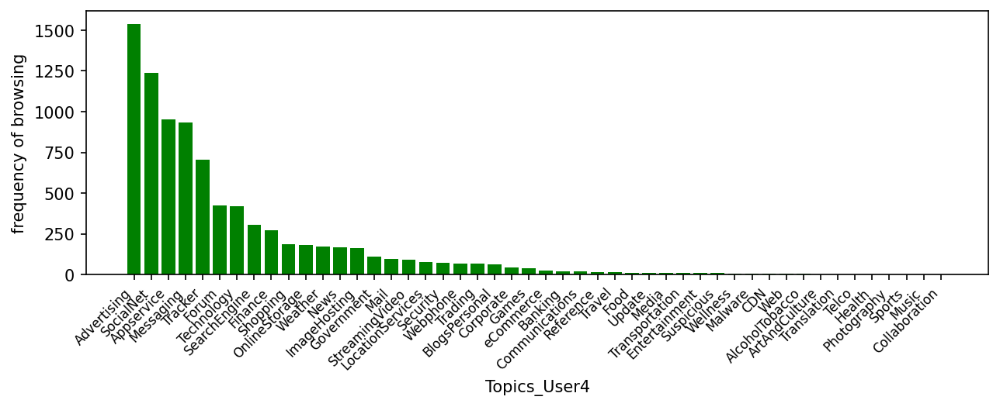

'user profiling for 5'

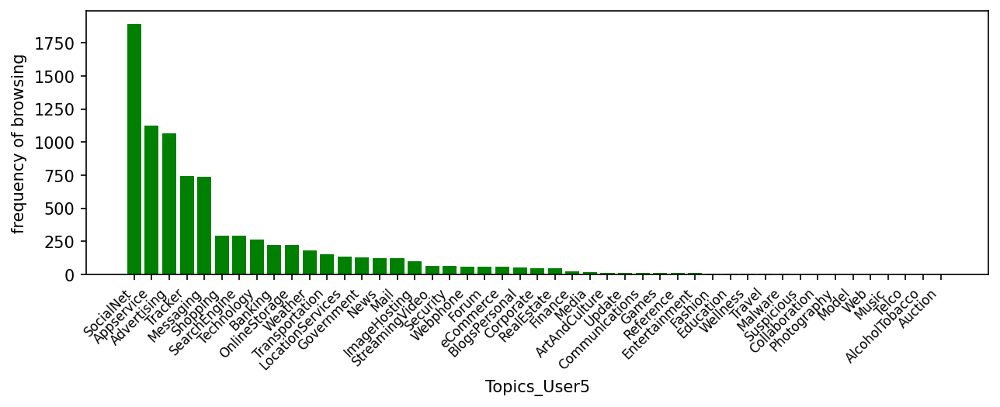

'user profiling for 6'

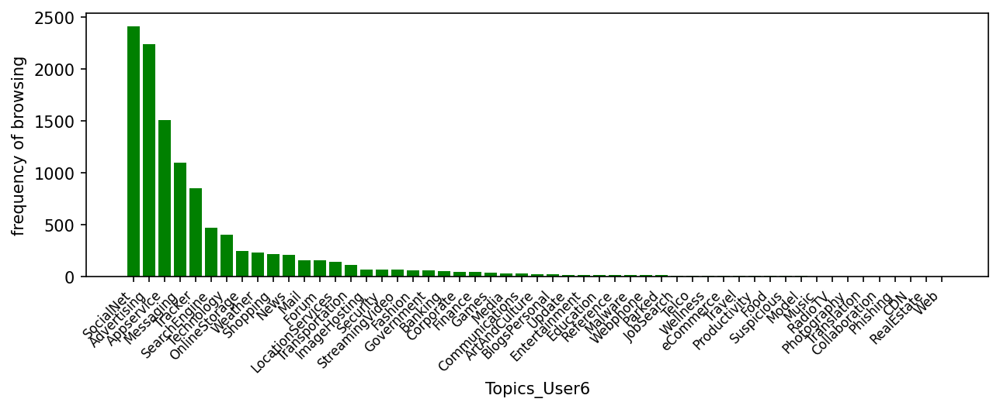

'user profiling for 7'

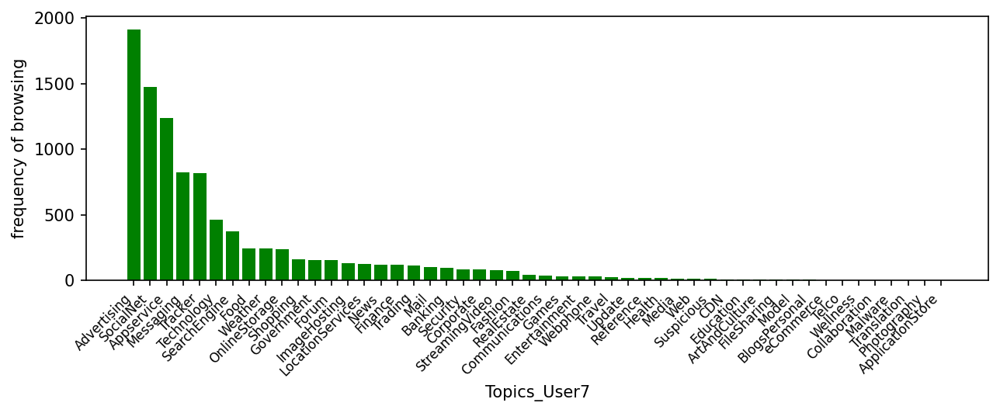

'user profiling for 8'

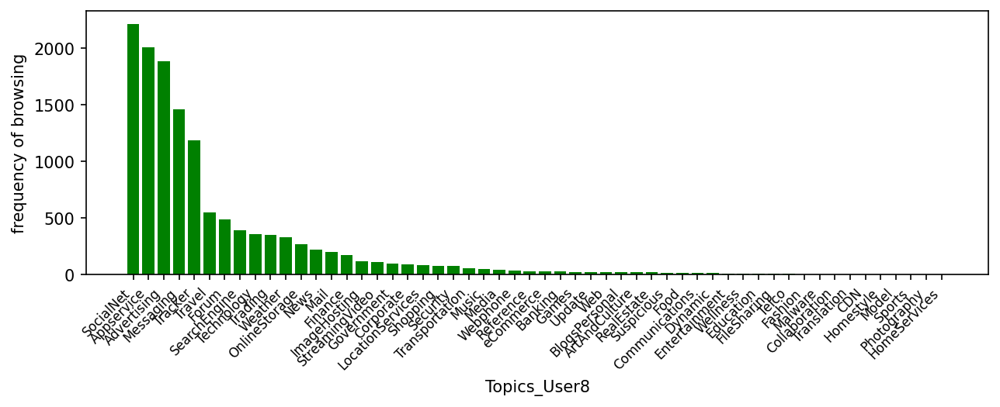

'user profiling for 9'

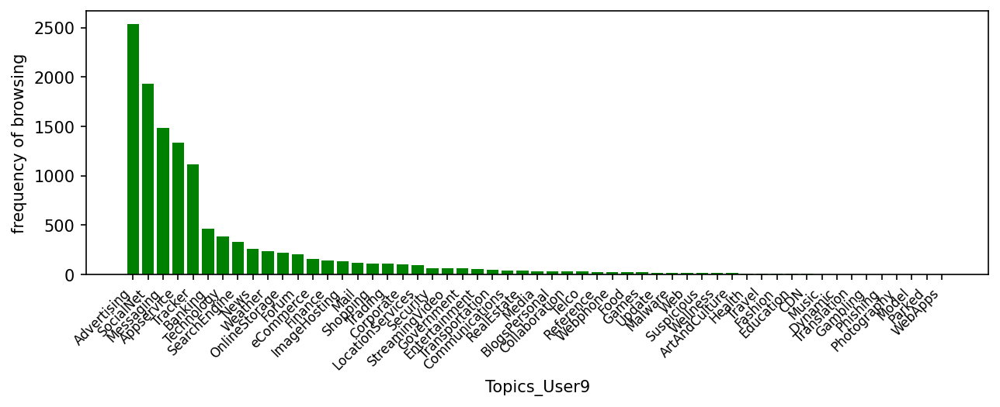

'user profiling for 10'

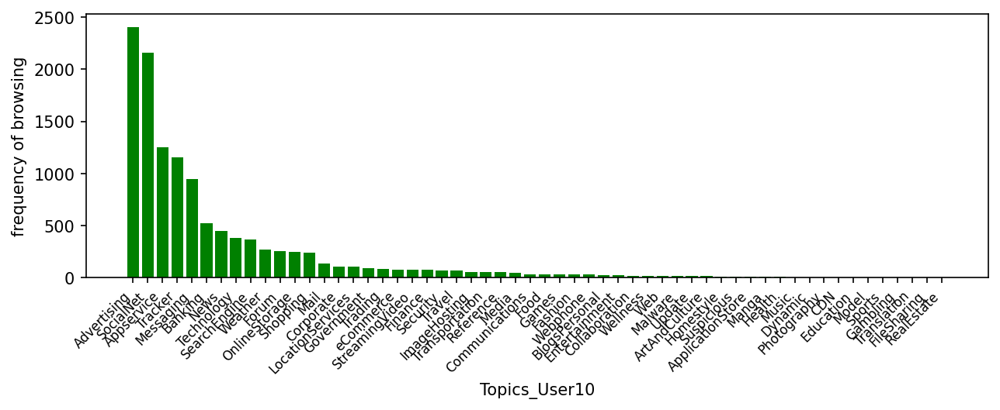

'user profiling for 11'

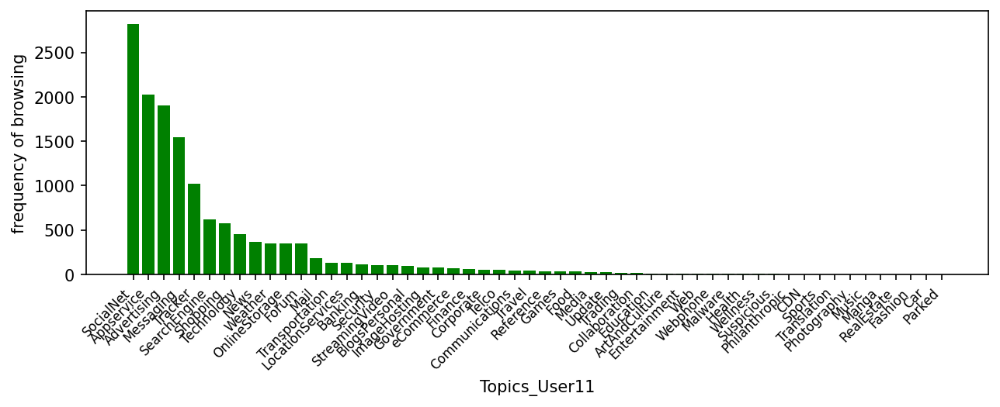

'user profiling for 12'

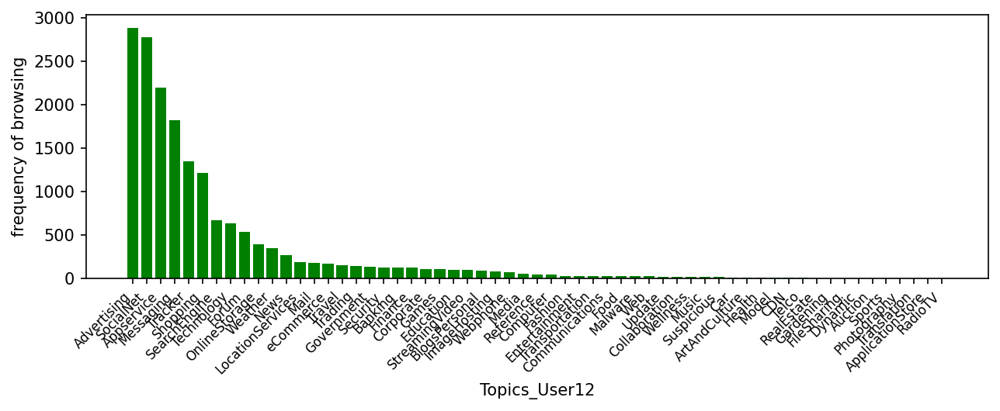

'user profiling for 13'

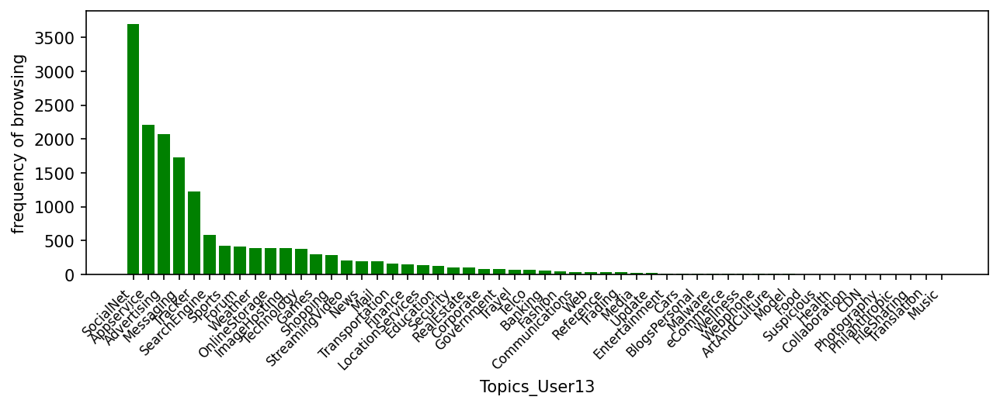

'user profiling for 14'

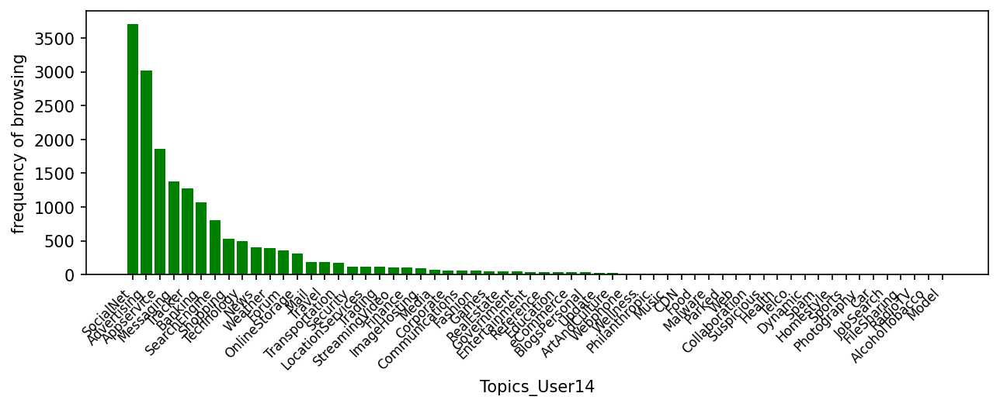

'user profiling for 15'

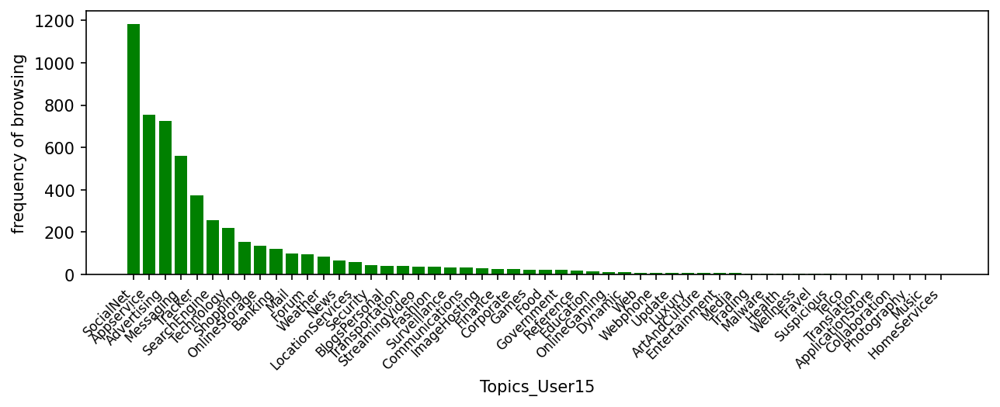

'user profiling for 16'

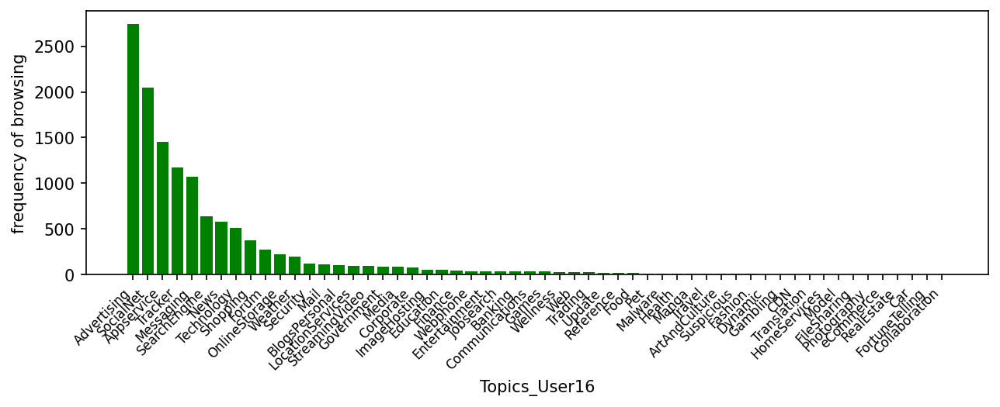

'user profiling for 17'

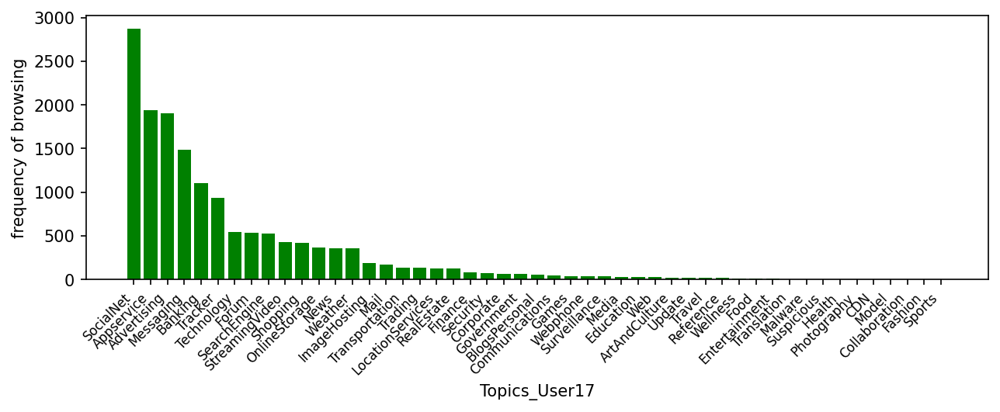

'user profiling for 18'

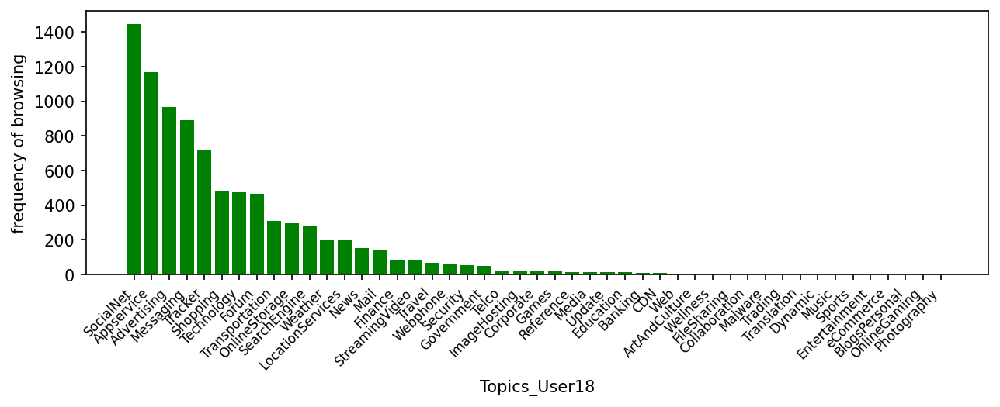

'user profiling for 19'

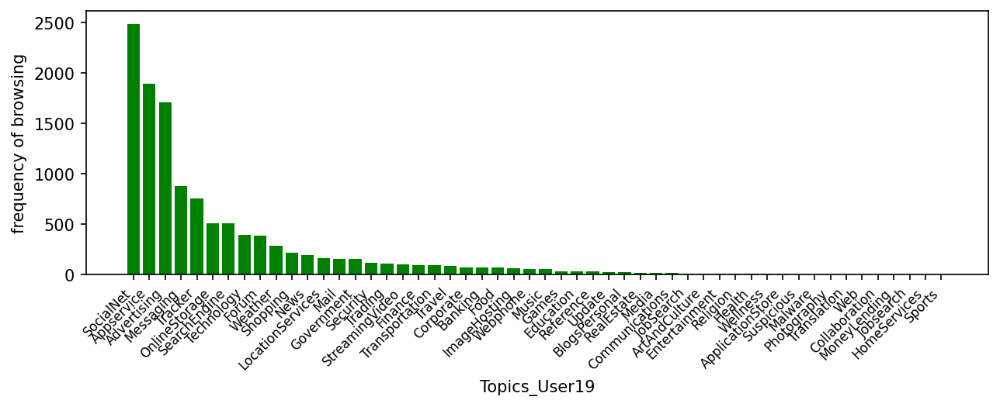

'user profiling for 20'

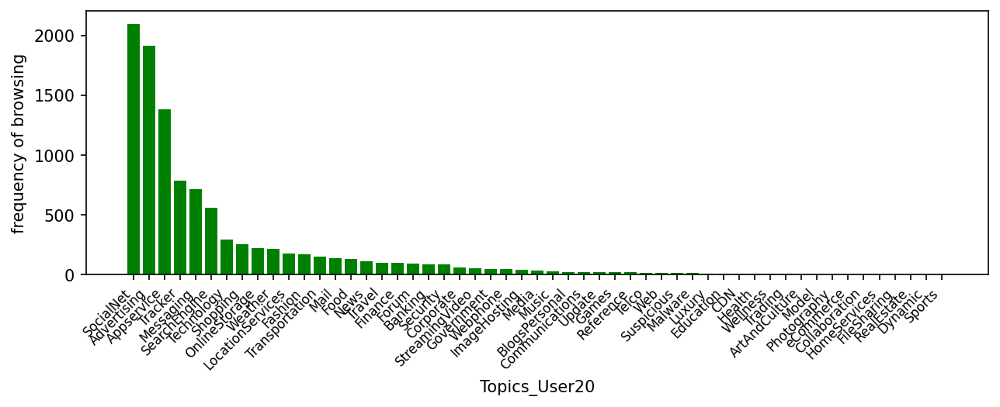

'user profiling for 21'

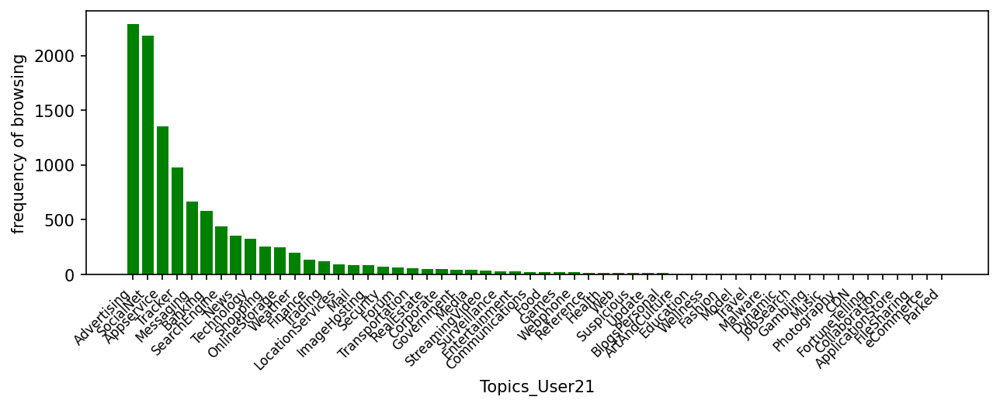

'user profiling for 22'

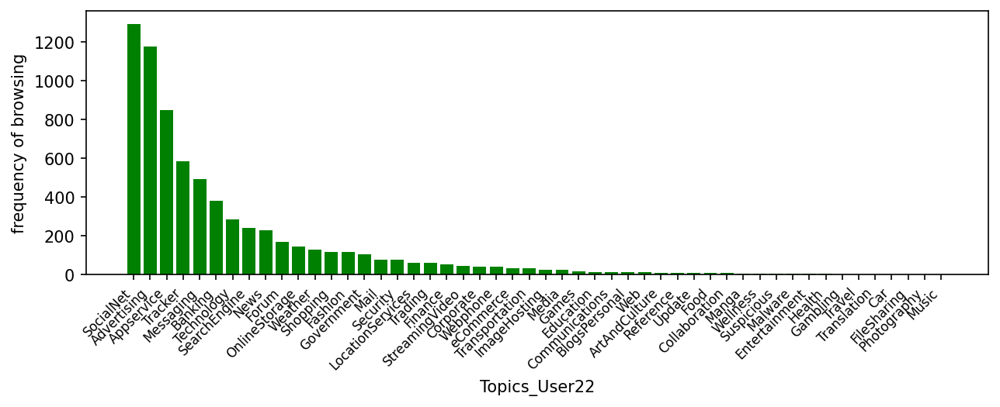

'user profiling for 23'

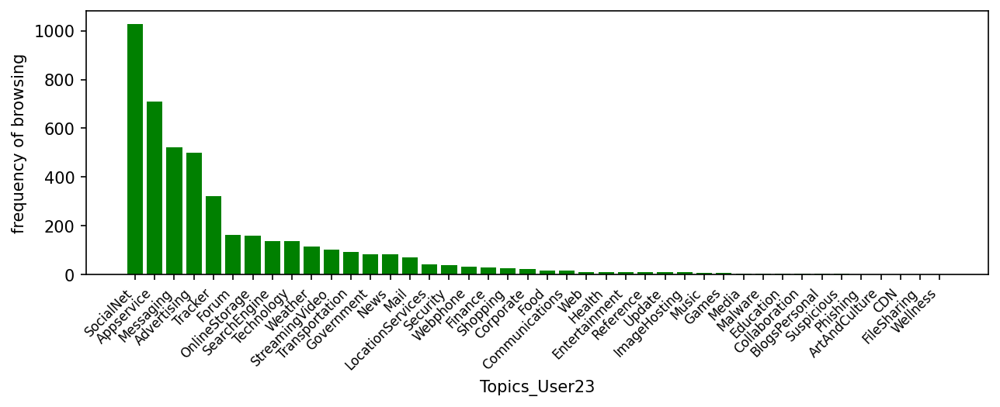

'user profiling for 24'

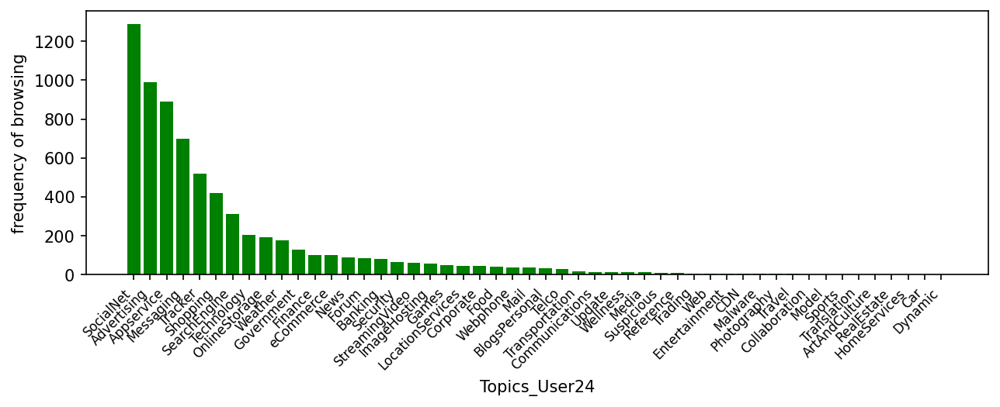

'user profiling for 25'

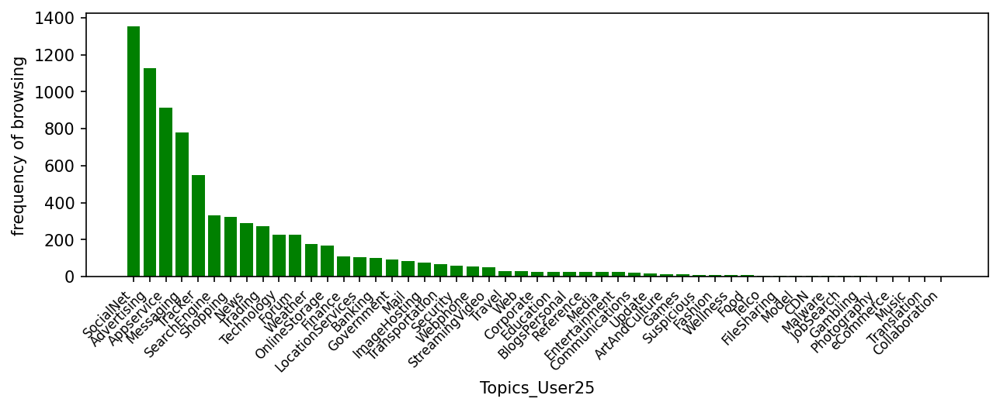

'user profiling for 26'

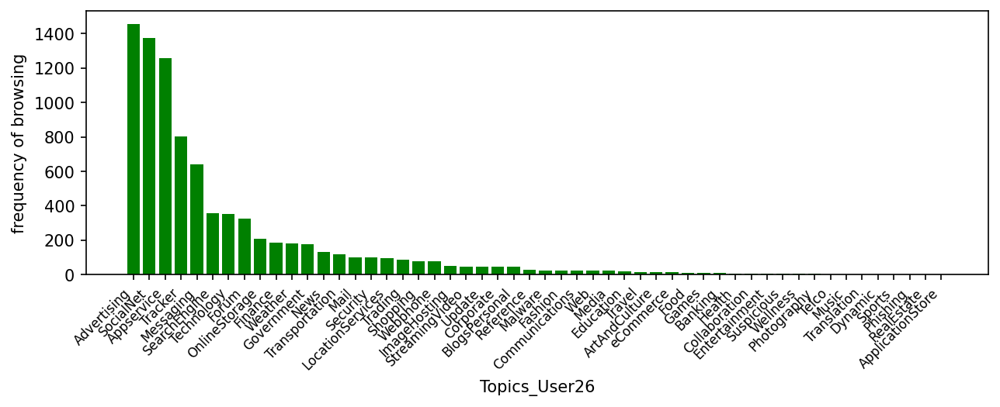

'user profiling for 27'

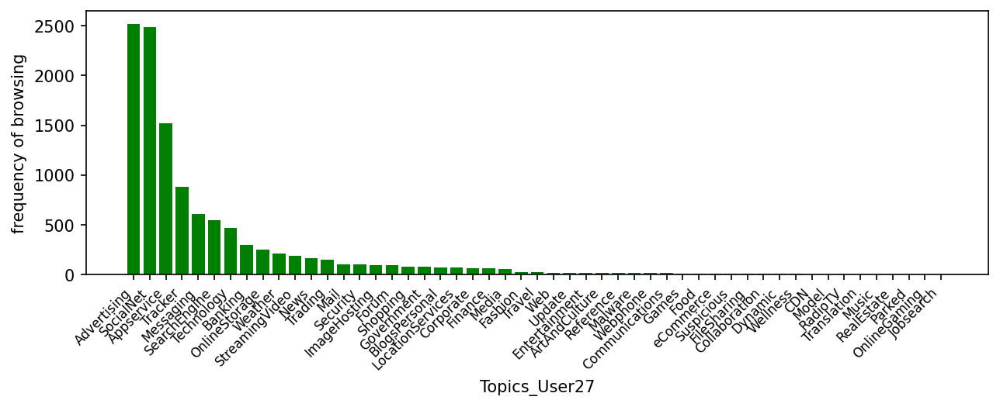

'user profiling for 28'

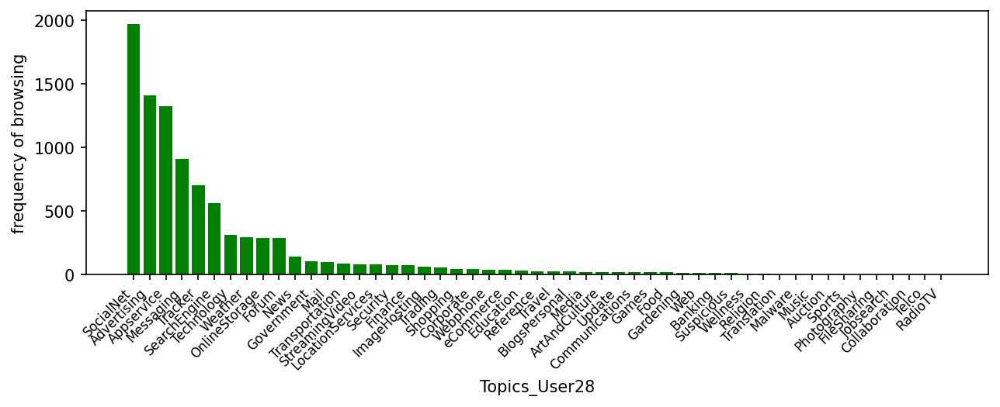

'user profiling for 29'

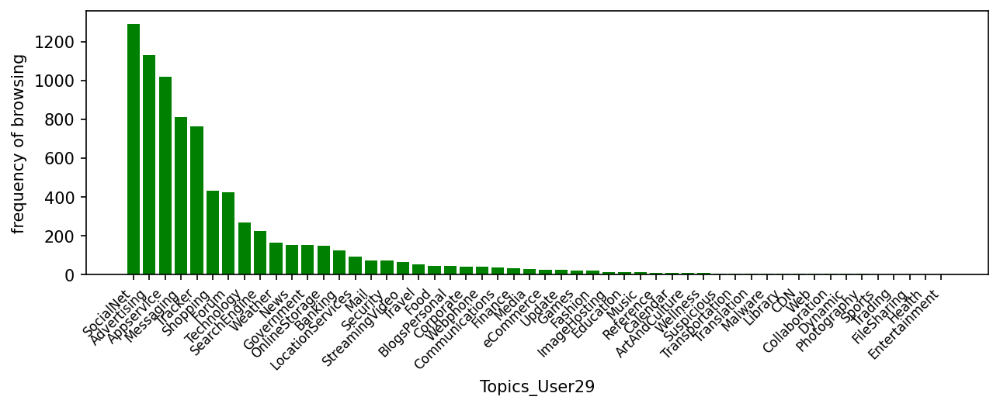

'user profiling for 30'

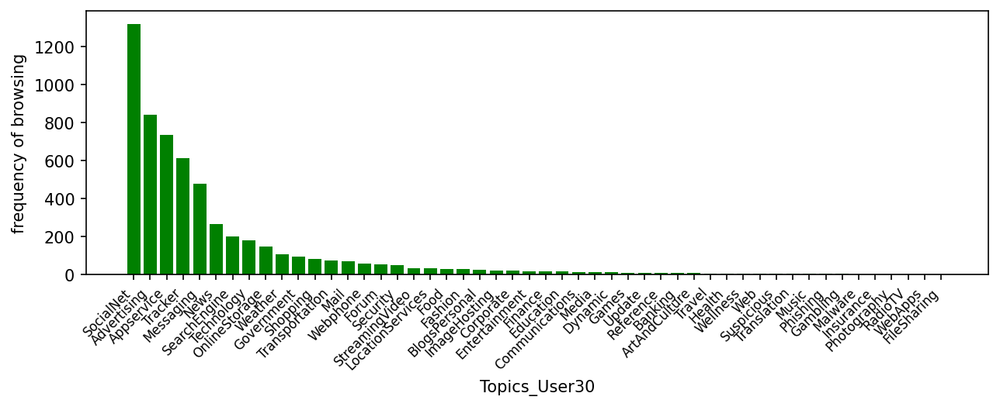

'user profiling for 31'

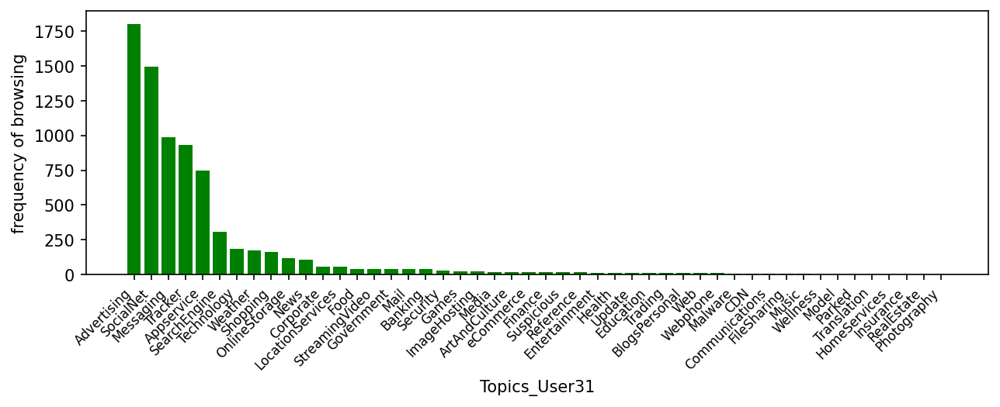

In [73]:
for user in sorted(pandas_df.user_id.unique()):
    display(f"user profiling for {user}")
    temp = pandas_df.loc[pandas_df.user_id == user, ["browsing_topic", "referer_topic"]]
    dic = pd.concat([temp.browsing_topic, temp.referer_topic], axis=0).value_counts().to_dict()
    if "Unknown" in dic.keys():
        del dic["Unknown"]
    if "NA" in dic.keys():
        del dic["NA"]
    dic = {k: val for k, val in dic.items() if val != 0}
    fig = plt.figure()
    plt.bar(dic.keys(), dic.values(), color='g')
    plt.xlabel(f'Topics_User{user}', fontsize=10)
    plt.xticks(rotation=45, fontsize=8, ha='right')
    plt.ylabel('frequency of browsing', fontsize=10)
    plt.show()

#### <font color="black"> some intepretation for our results: <br> - For example, the cluster for user2 and user 12, both of them browsed "coporate", "trading", "job search", which implies that they probabably are young professionals, in addition, "technology" is one of their very interested topic, they probably are working in this domain.


In [74]:
pandas_df[pandas_df.browsing_topic=="Advertising"]

,user_id,browsing_topic,duration,referer_topic
183,12,Advertising,180547,Unknown
396,12,Advertising,95,Unknown
399,12,Advertising,36681,Unknown
401,12,Advertising,76757,Unknown
402,12,Advertising,89301,Unknown
...,...,...,...,...
323708,23,Advertising,12107,Unknown
323728,23,Advertising,339,Unknown
323829,23,Advertising,37174,Unknown
324088,23,Advertising,42937,Unknown


## <font color="green">Reference:
 - Spark: https://spark.apache.org/docs/latest/api/python/reference/api/pyspark.sql.DataFrame.html
 - SOM： https://medium.com/analytics-vidhya/self-organizing-map-customer-segmentation-in-banking-9d7ce96bd3ec
 - dendrogram: https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html